# Анализ фондового рынка. 

## <b>Описание проекта</b><br>
Собран датафрейм, осуществлена предобработка, добавлены метрики и проведен исследовательский анализ цены за последние 3 года(на момент декабря 2023 г). В исследовании использованы скользящие средние, экспотенциальные скользящие средние и RSI индикатор.


## **Содержание**
1. [Предобработка и выгрузка данных](#1)
2. [Исследовательский анализ данных](#2)
3. [Скользящие средние](#3)
4. [Экспоненциальные скользящие средние](#4)
5. [Расчет индикатора RSI](#5)
6. [Модель прогноза цены акции](#6)


Обозначим данные о биржевых котировках:

* date - дата получения информации о биржевой котировке
* open - цена открытия интервала
* high - максимум цены интервала(максимальная цена сделки за текущий торговый день)
* low - минимум цены интервала(минимальная цена сделки за текущий торговый день)
* close - цена закрытия интервала
* vol - количество акций, проданных в данный день
* company_name - тикер, краткое название актива

<a id="1"></a> <br>
# Предобработка и выгрузка данных

In [1]:
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
plt.style.use("fivethirtyeight")
import seaborn as sns
from sklearn.metrics import mean_squared_error,mean_absolute_error

In [2]:
path = '*.csv'
globbed_files = glob.glob(path)
print("files:", globbed_files)
df = pd.DataFrame(columns=['<TICKER>', '<DATE>', '<TIME>', '<OPEN>', '<HIGH>', '<LOW>', '<CLOSE>', '<VOL>'])

files: ['banep.csv', 'chmf.csv', 'lkoh.csv', 'rosn.csv', 'sibn.csv', 'tatnp.csv']


In [3]:
for file in globbed_files:
    file = pd.read_csv(file, sep=';', parse_dates=['<DATE>'], dayfirst=True)
    df = pd.concat([
        df if not df.empty else None,
        file])

In [4]:
df = df.reset_index(drop=True)
df

,<TICKER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,BANEP,2020-12-10,0,1214.5,1229.5,1212.0,1225.5,67116
1,BANEP,2020-12-11,0,1228.5,1234.0,1218.5,1221.0,61651
2,BANEP,2020-12-14,0,1225.0,1230.5,1215.0,1215.0,89688
3,BANEP,2020-12-15,0,1218.5,1221.5,1212.0,1216.5,67263
4,BANEP,2020-12-16,0,1213.0,1219.5,1202.5,1205.0,80695
...,...,...,...,...,...,...,...,...
4455,TATNP,2023-12-05,0,620.6,635.6,619.3,632.9,288611
4456,TATNP,2023-12-06,0,632.8,635.0,618.8,621.4,291613
4457,TATNP,2023-12-07,0,621.4,632.2,618.0,624.0,363655
4458,TATNP,2023-12-08,0,625.2,632.5,624.0,632.4,173718


In [5]:
df = df.drop(columns=['<TIME>'])
df

,<TICKER>,<DATE>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,BANEP,2020-12-10,1214.5,1229.5,1212.0,1225.5,67116
1,BANEP,2020-12-11,1228.5,1234.0,1218.5,1221.0,61651
2,BANEP,2020-12-14,1225.0,1230.5,1215.0,1215.0,89688
3,BANEP,2020-12-15,1218.5,1221.5,1212.0,1216.5,67263
4,BANEP,2020-12-16,1213.0,1219.5,1202.5,1205.0,80695
...,...,...,...,...,...,...,...
4455,TATNP,2023-12-05,620.6,635.6,619.3,632.9,288611
4456,TATNP,2023-12-06,632.8,635.0,618.8,621.4,291613
4457,TATNP,2023-12-07,621.4,632.2,618.0,624.0,363655
4458,TATNP,2023-12-08,625.2,632.5,624.0,632.4,173718


In [6]:
df.columns = ['ticker', 'date', 'open', 'high', 'low', 'close', 'vol']
df.head()

,ticker,date,open,high,low,close,vol
0,BANEP,2020-12-10,1214.5,1229.5,1212.0,1225.5,67116
1,BANEP,2020-12-11,1228.5,1234.0,1218.5,1221.0,61651
2,BANEP,2020-12-14,1225.0,1230.5,1215.0,1215.0,89688
3,BANEP,2020-12-15,1218.5,1221.5,1212.0,1216.5,67263
4,BANEP,2020-12-16,1213.0,1219.5,1202.5,1205.0,80695


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4460 entries, 0 to 4459
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ticker  4460 non-null   object        
 1   date    4460 non-null   datetime64[ns]
 2   open    4460 non-null   float64       
 3   high    4460 non-null   float64       
 4   low     4460 non-null   float64       
 5   close   4460 non-null   float64       
 6   vol     4460 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 244.0+ KB


In [8]:
print(f"Кортеж размеров массива: {df.shape}")

Кортеж размеров массива: (4460, 7)


In [9]:
# Посмотрим на всякий случай, все ли верно по датам по котировкам
for i in df['ticker'].unique():
    print(min(df[df['ticker'] == i]['date']))
    print(max(df[df['ticker'] == i]['date']))


2020-12-10 00:00:00
2023-12-11 00:00:00
2020-12-10 00:00:00
2023-12-11 00:00:00
2020-12-10 00:00:00
2023-12-11 00:00:00
2020-12-10 00:00:00
2023-12-11 00:00:00
2020-12-10 00:00:00
2023-12-11 00:00:00
2020-12-10 00:00:00
2023-12-11 00:00:00


In [10]:
# Перейдем к пропущенным значениям
df.isna().sum()

ticker    0
date      0
open      0
high      0
low       0
close     0
vol       0
dtype: int64

Все чисто, пропущенных данных нет, данные загрузились и не требуют дополнительной проверки

In [11]:
df.duplicated().sum()  # дубликатов нет

0

<a id="2"></a> <br>
# Исследовательский анализ данных


Построю линейные графики динамики цены для каждой акции

In [12]:
init_notebook_mode(connected=True)
temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), width=800))
colors=px.colors.qualitative.Plotly

In [13]:
train_date=df.date.unique()

for i in df['ticker'].unique():
    plt.figure(figsize=(8, 5))
    title = f"Средняя рыночная цена закрытия акций {i} и торгуемые акции"
    close_avg=df[df['ticker'] == i].groupby('date')['close'].mean().rename('Closing Price')
    vol_avg=df[df['ticker'] == i].groupby('date')['vol'].mean().rename('Volume')

    fig = make_subplots(rows=2, cols=1, 
                        shared_xaxes=True)
    for i, j in enumerate([close_avg, vol_avg]):
        fig.add_trace(go.Scatter(x=train_date, y=j, mode='lines',
                                 name=j.name, marker_color=colors[i]), row=i+1, col=1)
    fig.update_xaxes(rangeslider_visible=False,
                     rangeselector=dict(
                         buttons=list([
                             dict(count=6, label="6 мес.", step="month", stepmode="backward"),
                             dict(count=1, label="1 год", step="year", stepmode="backward"),
                             dict(count=2, label="2 года", step="year", stepmode="backward"),
                             dict(count=2, label="3 года", step="year", stepmode="backward"),
                             dict(step="all", label='за все время')])),
                     row=1,col=1)
    fig.update_layout(template=temp,title=title, 
                      hovermode='x unified', height=700, 
                      yaxis1_title='Цена закрытия', yaxis2_title='Кол-во акций',
                      showlegend=False)
    fig.show()

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

Решила нарисовать одновременно динамику цены закрытия и количество проданных акций 6 российскийх нефтегазовых компаний.

Можно заметить, что цены акций сохранялись приблизительно на одном уровне до 24 февраля 2022 года. Как известно, в этот день на фоне начала специальной военной операции России на Украине индекс Мосбиржи упал на 33.28 % по итогу дня, что стало абсолютным историческим рекордом...

К концу года индекс так и не восстановился до уровней прошлого года. Также можно заметить, что в целом по количествам проданных акций нефтегазовых компаний произошло снижение объемов торгов.

И если в цене акций видно более менее стабильные падения/рост стоимостей, то в графиках объемов торгов есть резкие скачки/падения. Опустим момент с 24 февраля.Наибольшие скачки наблюдаются, если оценить визуально, у Лукойла и Газпром нефти,  у остальных компаний объемы торгов чуть стабильнее.

Так, например, среди важных событий считают публикацию достаточно сильных отчетностей Мосбиржи, «Газпром нефти», МТС и «Нижнекамскнефтехима». Результаты «Газпром нефти», опубликованные 24 августа, подтвердили позитивные ожидания от компаний нефтяной отрасли, что объясняет рост проданного количества акций. 

Аналогично была на слуху новость о возможном выкупе акций «Лукойла» у нерезидентов с дисконтом. Компания не подтвердила слухи, но в моменте акции росли более чем на 5%, а по итогам всей недели прибавили 4,6% $^{1}$. </br>.

Также, как известно, ближе к июню несколько компаний из числа "голубых фишек" отказалось от дивидендных выплат, и инвесторы стали распродавать акции, что тоже негативно сказалось на динамике.

В среднем цены на акции начали расти приблизительно весной-в начале лета 2023 года, достигнув преждних значений к недавнему времени.

*Источники:*

*${^1}$ Ведомости: https://www.vedomosti.ru/investments/articles/2023/08/27/992089-chto-proishodilo-s-21-po-25-avgusta?ysclid=lqi2ucolgw670061861*

In [14]:
for i in df['ticker'].unique():
    plt.figure(figsize=(8, 5))
    open_avg=df[df['ticker'] == i].groupby('date')['open'].mean()
    high_avg=df[df['ticker'] == i].groupby('date')['high'].mean()
    low_avg=df[df['ticker'] == i].groupby('date')['low'].mean()
    close_avg=df[df['ticker'] == i].groupby('date')['close'].mean() 
    buttons=[]

    fig = go.Figure()
    open_avg=df[df['ticker'] == i].groupby('date')['open'].mean()
    high_avg=df[df['ticker'] == i].groupby('date')['high'].mean()
    low_avg=df[df['ticker'] == i].groupby('date')['low'].mean()
    close_avg=df[df['ticker'] == i].groupby('date')['close'].mean()        

    fig.add_trace(go.Candlestick(x=train_date, open=open_avg, high=high_avg,
                                 low=low_avg, close=close_avg))
    fig.update_xaxes(rangeslider_visible=True,
                     rangeselector=dict(
                         buttons=list([
                             dict(count=3, label="3 мес.", step="month", stepmode="backward"),
                             dict(count=6, label="6 мес.", step="month", stepmode="backward"),
                             dict(step="all", label='за все время')]), xanchor='left',yanchor='bottom', y=1.16, x=.01))
    title = f"Движение цен на акции {i}"
    fig.update_layout(template=temp,title=title, 
                      hovermode='x unified', showlegend=False, width=1000,
                      updatemenus=[dict(active=0, type="dropdown",
                                        buttons=buttons, xanchor='left',
                                        yanchor='bottom', y=1.01, x=.01)],
                      yaxis=dict(title='Stock Price'))
    fig.show()

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [15]:
# посмотрим на участки "обрыва"
df[(df['ticker'] == 'BANEP') & (df['date'].dt.year == 2022) & (df['date'].dt.month == 3)]

,ticker,date,open,high,low,close,vol
308,BANEP,2022-03-28,616.0,616.0,529.5,564.0,129999
309,BANEP,2022-03-29,564.0,598.0,550.5,561.5,103681
310,BANEP,2022-03-30,576.5,605.5,556.5,604.0,72722
311,BANEP,2022-03-31,611.5,700.0,605.5,681.0,122978


Я решила найти график динамики котировок акций, в котором можно будет посмотреть и цену открытия, закрытия, мин. стоимость и  кол-во проданных акций </br>

Посмотрев на динамику и заметив пробелы, не обратив внимания на даты, я решила, что просто отсутствуют данные из-за какой-то случайной или систематической ошибки. Обнаружив такую же ситуацию в нескольких компаниях, я поняла, что это вовсе не ошибка. </br>

Что это за дата? Вполне ожидаемо, это февраль-март 2022 года, но нужно было убедиться. </br>

ЦБ закрыл торги и расчеты на всех рынках Московской биржи с 25 февраля(они проводились только в отдельных секциях, вкл. срочный рынок(кроме валютных пар) и товарную секцию).  </br>

3 марта Лондонская биржа остановила торги расписками всех российских компаний. Некоторые из них за последние дни обесценились почти на 100%$^{2}$. </br>

Рубль и бумаги российских компаний на Московской бирже и на зарубежных площадках обрушились после введения западных санкций в ответ на проведение «специальной военной операции»* на Украине. </br>

*Источники:*

*${^2}$ РБК Инвестиции: https://quote.rbc.ru/news/article/623a17b29a7947fc848df779*


In [16]:
price_changes = dict()

for company in df['ticker'].unique():
    company_data = df[df['ticker'] == company].copy() 
    company_data.loc[:, 'price_change'] = company_data['close'].diff() 
    
    max_increase_date = company_data.loc[company_data['price_change'] == company_data['price_change'].max(), 'date'].values
    max_decrease_date = company_data.loc[company_data['price_change'] == company_data['price_change'].min(), 'date'].values
    
    price_changes[company] = {
        'max_increase_date': max_increase_date, 
        'max_decrease_date': max_decrease_date
    }

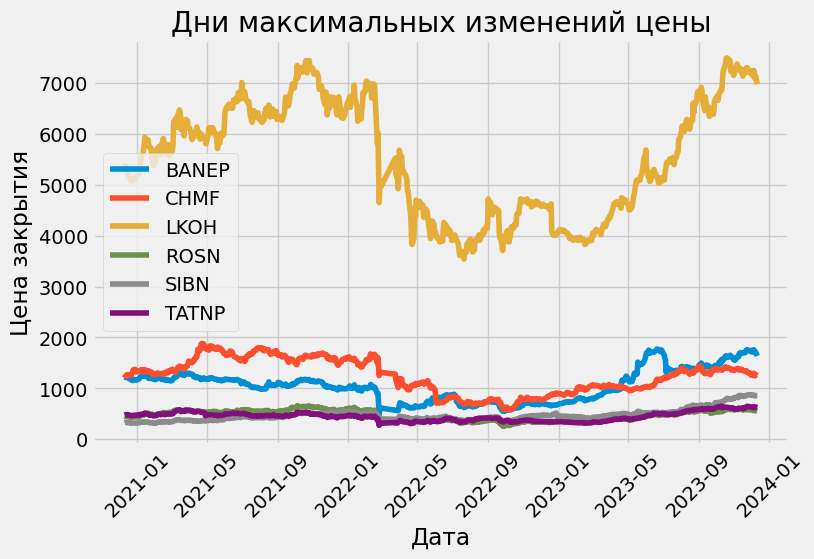

In [17]:
plt.figure(figsize=(8, 5))
for company in df['ticker'].unique():
    company_data = df[df['ticker'] == company].copy() 
    company_data['price_change'] = company_data['close'].diff()
    max_value = company_data['price_change'].max()
    min_value = company_data['price_change'].min()
    max_increase_date = company_data.loc[company_data['price_change'] == company_data['price_change'].max(), 'date'].values
    max_decrease_date = company_data.loc[company_data['price_change'] == company_data['price_change'].min(), 'date'].values
    price_changes[company] = {'max_increase_date': max_increase_date, 'max_decrease_date': max_decrease_date}
    plt.plot(company_data['date'], company_data['close'], label=company)

for company, changes in price_changes.items():
    company_data = df[df['ticker'] == company]

plt.xlabel('Дата')
plt.ylabel('Цена закрытия')
plt.title('Дни максимальных изменений цены')
plt.legend()

# Поворот значений по оси x на 45 градусов
plt.xticks(rotation=45)

plt.show()

In [18]:
for company, changes in price_changes.items():
    print(f"Для компании '{company}':")
    print(f"Дата максимального увеличения цены: {changes['max_increase_date']}")
    print(f"Дата максимального уменьшения цены: {changes['max_decrease_date']}")
    print()

Для компании 'BANEP':
Дата максимального увеличения цены: ['2023-05-18T00:00:00.000000000']
Дата максимального уменьшения цены: ['2022-02-24T00:00:00.000000000']

Для компании 'CHMF':
Дата максимального увеличения цены: ['2022-02-22T00:00:00.000000000']
Дата максимального уменьшения цены: ['2022-02-24T00:00:00.000000000']

Для компании 'LKOH':
Дата максимального увеличения цены: ['2022-03-24T00:00:00.000000000']
Дата максимального уменьшения цены: ['2022-02-24T00:00:00.000000000']

Для компании 'ROSN':
Дата максимального увеличения цены: ['2022-03-24T00:00:00.000000000']
Дата максимального уменьшения цены: ['2022-02-24T00:00:00.000000000']

Для компании 'SIBN':
Дата максимального увеличения цены: ['2022-02-25T00:00:00.000000000']
Дата максимального уменьшения цены: ['2022-02-24T00:00:00.000000000']

Для компании 'TATNP':
Дата максимального увеличения цены: ['2022-02-25T00:00:00.000000000']
Дата максимального уменьшения цены: ['2022-02-24T00:00:00.000000000']



* Результаты подтверждают выводы по предыдущим графикам -  максимальное уменьшение цены у всех нефтегазовых компаний состоялось 24 февраля 2022 года

<a id="3"></a> <br>
# 3. Найду скользящие средние (периоды 10, 50, 100) для каждой акции. 

Скользящая статистика - показатель, вычисляемые за фикс. промежуток времени с перемещением вперед по всему временному ряду.

Скользящие статистики называются индикаторами 

In [19]:
#  window - временное окно, т.е. число охватываемых индексных зн-ий
def moving_average(name):
    data = pd.DataFrame(df[df['ticker'] == name][['date', 'close']]).dropna()
    data.set_index('date', inplace=True)
    data['mean_10'] = data['close'].rolling(window=10).mean()
    data['mean_50'] = data['close'].rolling(window=50).mean()
    data['mean_100'] = data['close'].rolling(window=100).mean()
    plt.figure(figsize=(10, 5))
    title = f"Скользящие статистики для среднего значения для тикера {name}"
    ax = data[['mean_10', 'mean_50', 'mean_100']].plot(title=title, xlabel='Дата', style=['g--', 'r--', 'k--'], lw=0.8);
    data['close'].plot(ax=ax, lw=1.5);
    #sns.lineplot(data=data, x='date', y='close')

<Figure size 1000x500 with 0 Axes>

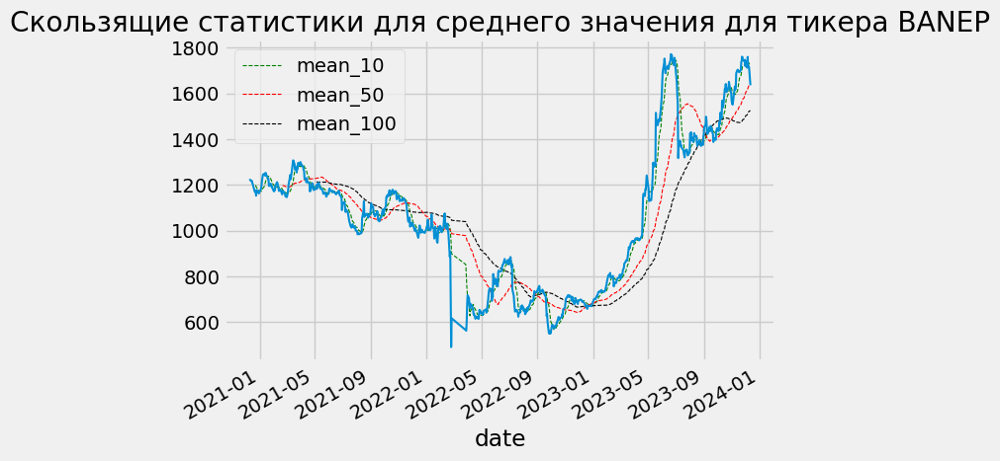

<Figure size 1000x500 with 0 Axes>

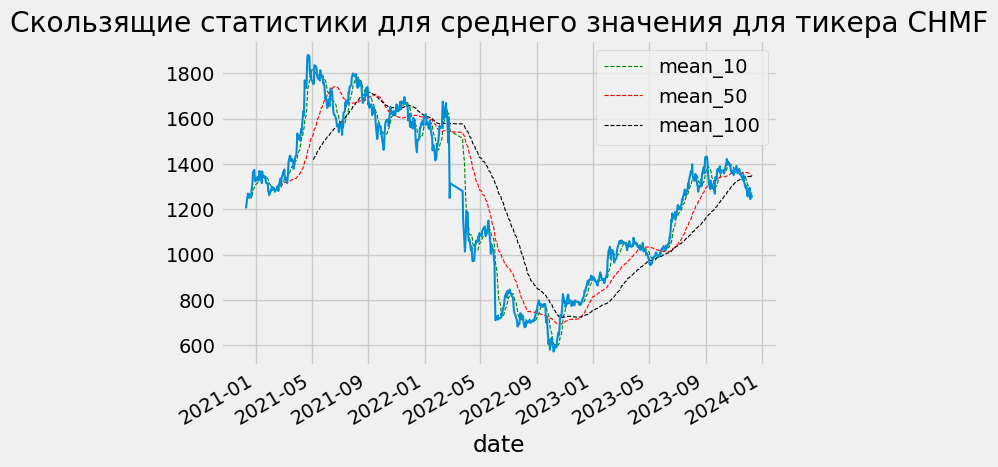

<Figure size 1000x500 with 0 Axes>

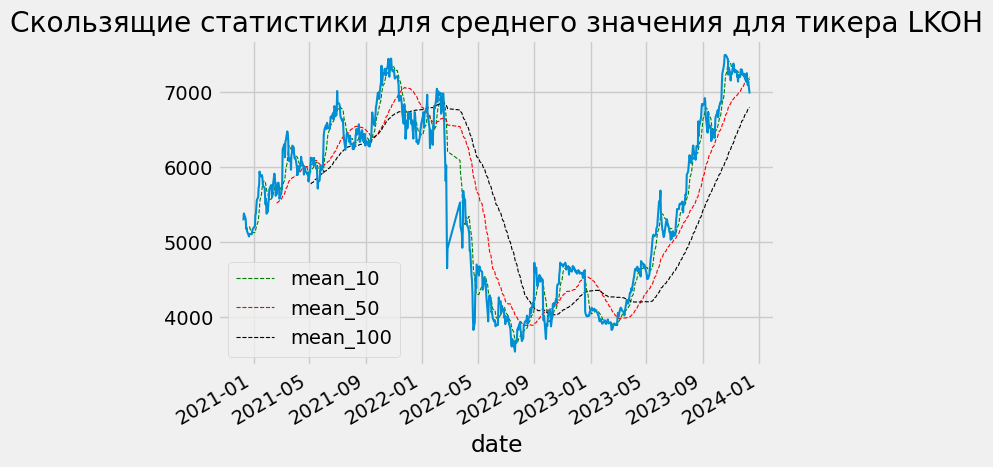

<Figure size 1000x500 with 0 Axes>

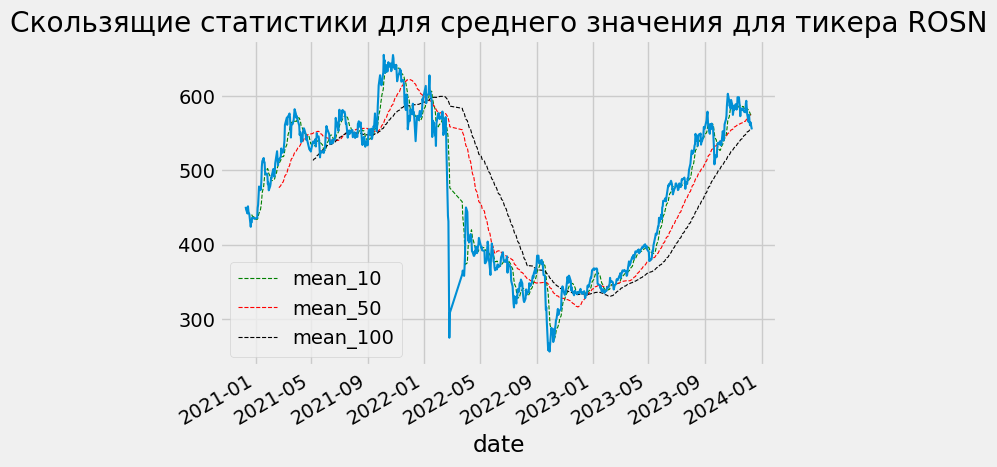

<Figure size 1000x500 with 0 Axes>

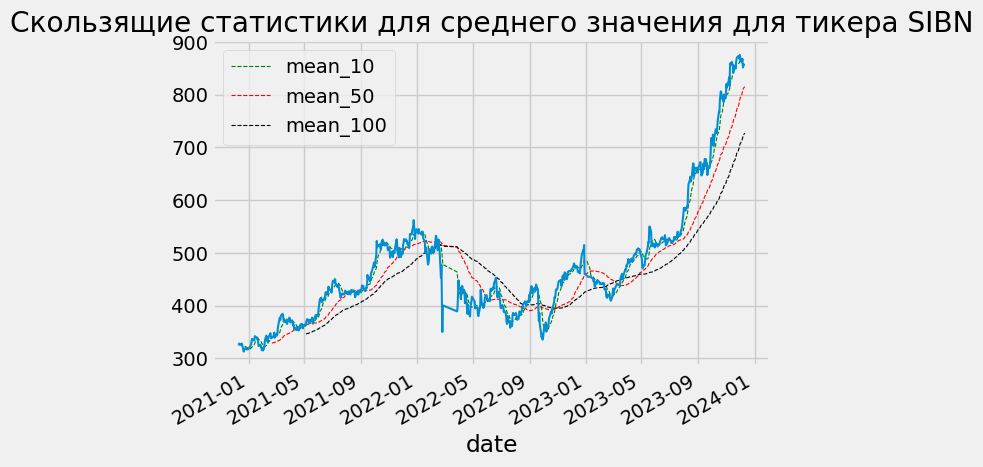

<Figure size 1000x500 with 0 Axes>

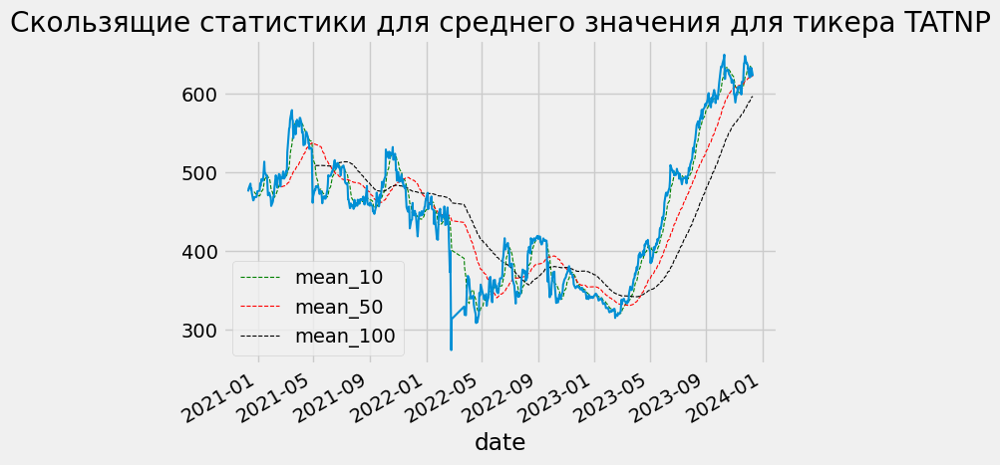

In [20]:
company_name = ["BANEP", "CHMF", "LKOH", "ROSN", "SIBN", "TATNP"]
for i in company_name:
    moving_average(i)

**В чем смысл расчета простых скользящих средних?**

Когда график краткосрочной скользящей средней(в нашем случае так при window=10) пересекает график долгосрочной скользящей средней(в нашем случае так при window=100) снизу вверх, трейдер скупает акции

Аналогично при пересечении сверху вниз - трейдер продает их.

Попробую изобразить котировки акций, два простых скользящих средних и позиции

In [21]:
def sma(name):
    data = pd.DataFrame(df[df['ticker'] == name][['date', 'close']]).dropna()
    data.set_index('date', inplace=True)
    data['SMA1'] = data['close'].rolling(window=10).mean()
    data['SMA2'] = data['close'].rolling(window=100).mean()
    data['positions'] = np.where(data['SMA1'] > data['SMA2'], 1, -1)
    plt.figure(figsize=(10, 5))
    title = f"Скользящие статистики для среднего значения для тикера {name}"
    ax = data[['SMA1', 'SMA2', 'positions']].plot(title=title, lw=0.8, secondary_y='positions', mark_right=False)
    ax.get_legend().set_bbox_to_anchor((0.25, 0.85));
    data['close'].plot(ax=ax, lw=1.5)
    plt.xlabel('Дата')
    plt.show()
    #sns.lineplot(data=data, x='date', y='close')

<Figure size 1000x500 with 0 Axes>

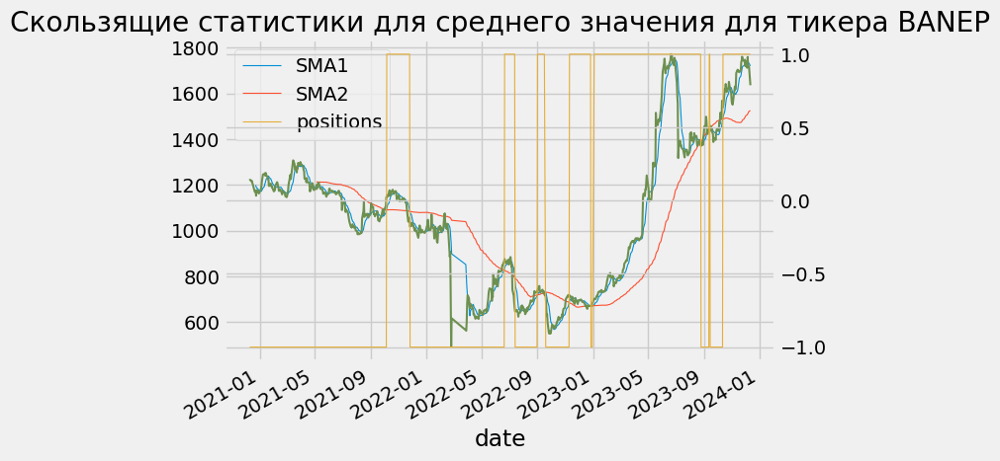

<Figure size 1000x500 with 0 Axes>

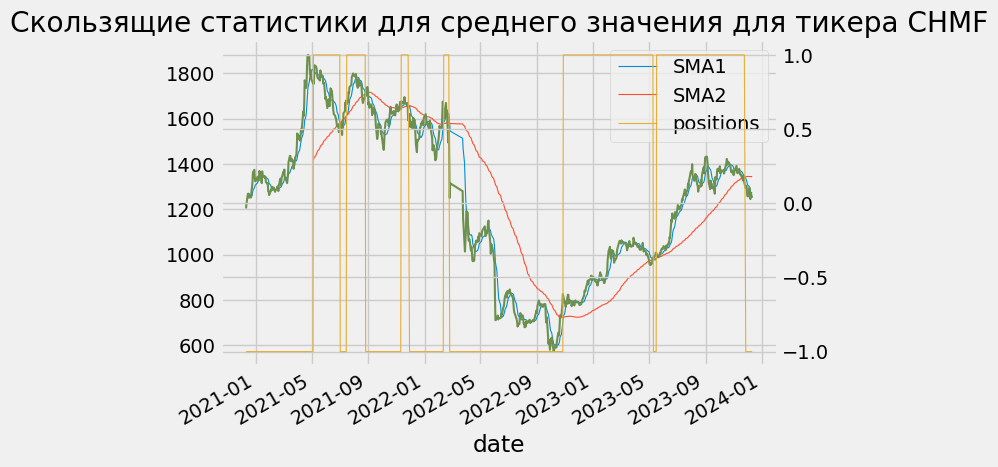

<Figure size 1000x500 with 0 Axes>

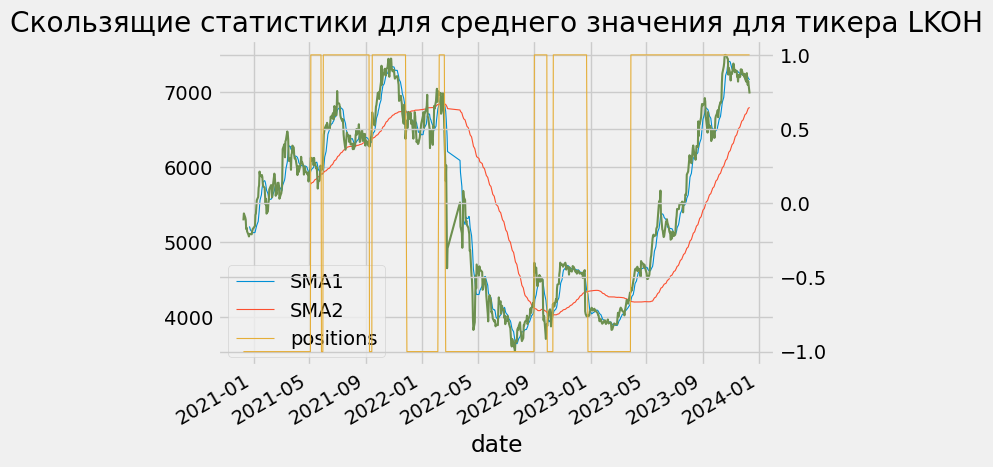

<Figure size 1000x500 with 0 Axes>

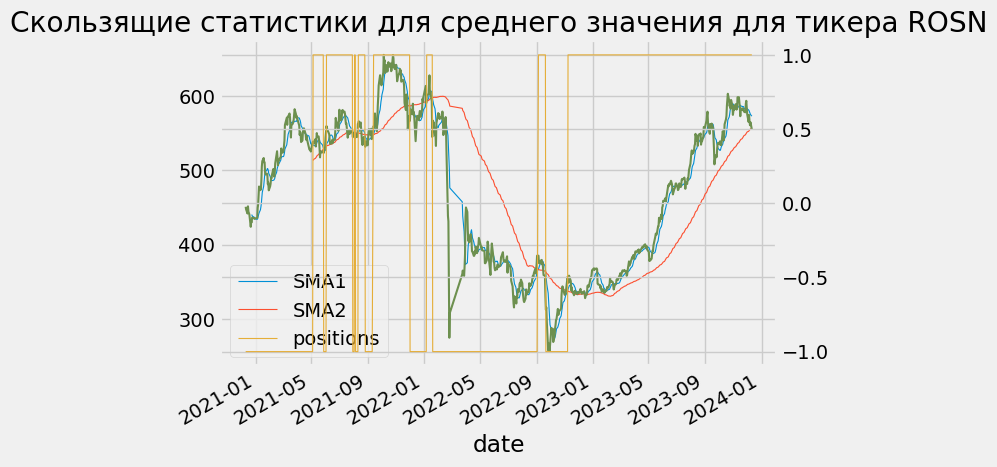

<Figure size 1000x500 with 0 Axes>

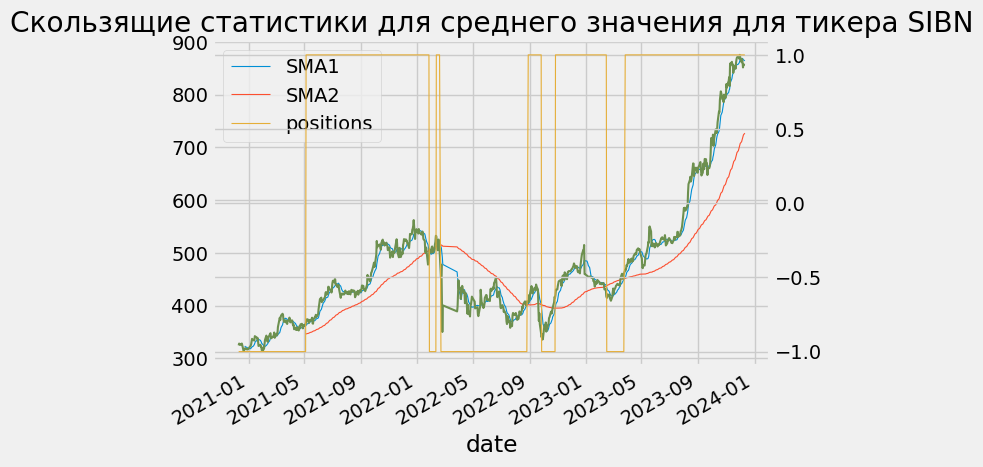

<Figure size 1000x500 with 0 Axes>

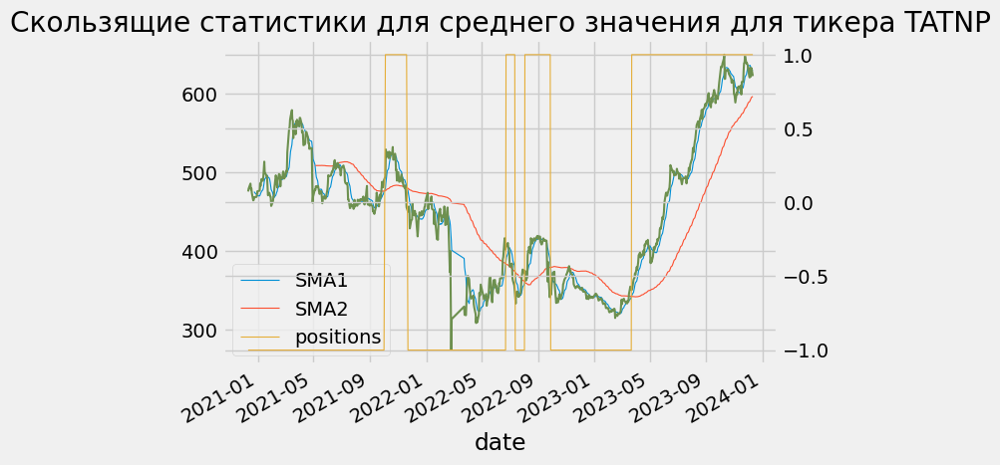

In [22]:
for i in company_name:
    sma(i)

По представленным выше данным на графике можно было теоретически сделать выводы о скупке/продажи акций компаний. 

**Теперь объединим представленные выше данные**

In [23]:
df.head()

,ticker,date,open,high,low,close,vol
0,BANEP,2020-12-10,1214.5,1229.5,1212.0,1225.5,67116
1,BANEP,2020-12-11,1228.5,1234.0,1218.5,1221.0,61651
2,BANEP,2020-12-14,1225.0,1230.5,1215.0,1215.0,89688
3,BANEP,2020-12-15,1218.5,1221.5,1212.0,1216.5,67263
4,BANEP,2020-12-16,1213.0,1219.5,1202.5,1205.0,80695


In [24]:
df['year'] = df['date'].dt.year

In [25]:
def vol(ticker, year):
    data = df[(df['ticker']  == ticker) & (df['year'] == year)][['date', 'close', 'vol', 'year']]
    data['mean_50'] = data['close'].rolling(window=50).mean()
    data['mean_100'] = data['close'].rolling(window=100).mean()
    
    fig, ax = plt.subplots(figsize=(8, 5))
    sns.lineplot(data=data, x='date', y='close', ax=ax, lw=2, label='Цена акции') 
    sns.lineplot(data=data, x='date', y='mean_50', ax=ax, linestyle='--', lw=0.8, label='Среднее периода 50')
    sns.lineplot(data=data, x='date', y='mean_100', ax=ax, linestyle='--', lw=0.8, label='Среднее периода 100')
    ax.set_title(f"Движение цен на акции тикера {ticker} в {year}")
    ax.set_xlabel('Дата')
    ax.set_ylabel('Цена')
    plt.grid()
    ax.legend()
    plt.show()
    
    plt.figure(figsize=(8, 5))
    sns.lineplot(data=data,
                 x='date',
                 y='vol',
                )
    
    plt.title(f'Движение кол-ва проданных акций тикера {ticker} в {year}')
    plt.ylabel('Объем')
    plt.xlabel('Дата')
    plt.grid()
    plt.show()

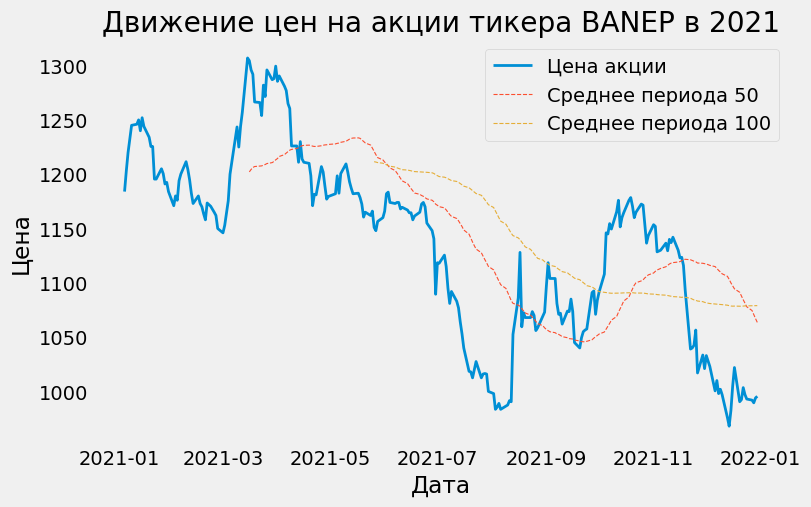

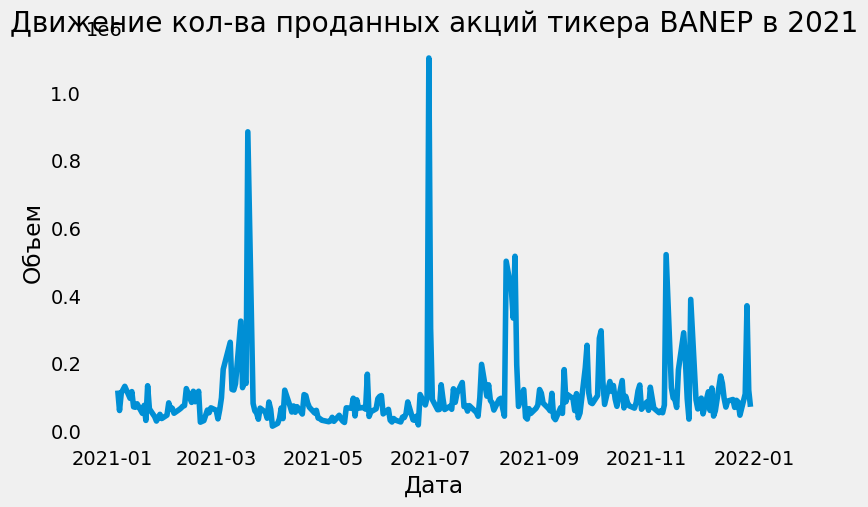

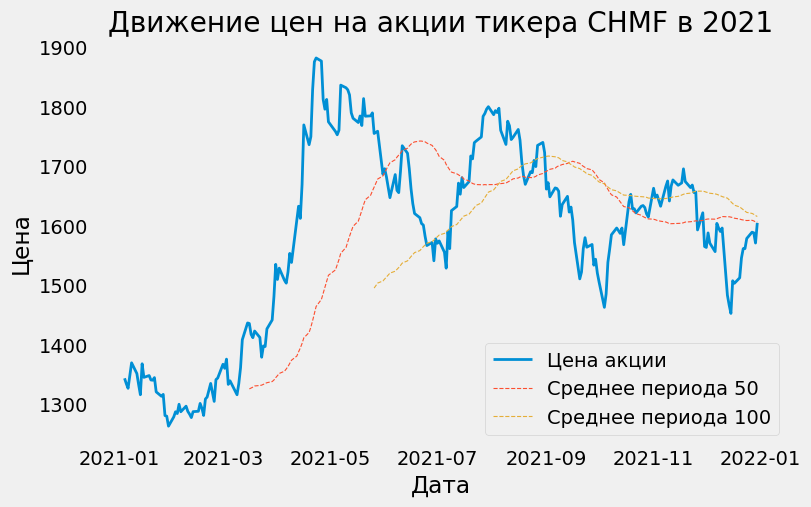

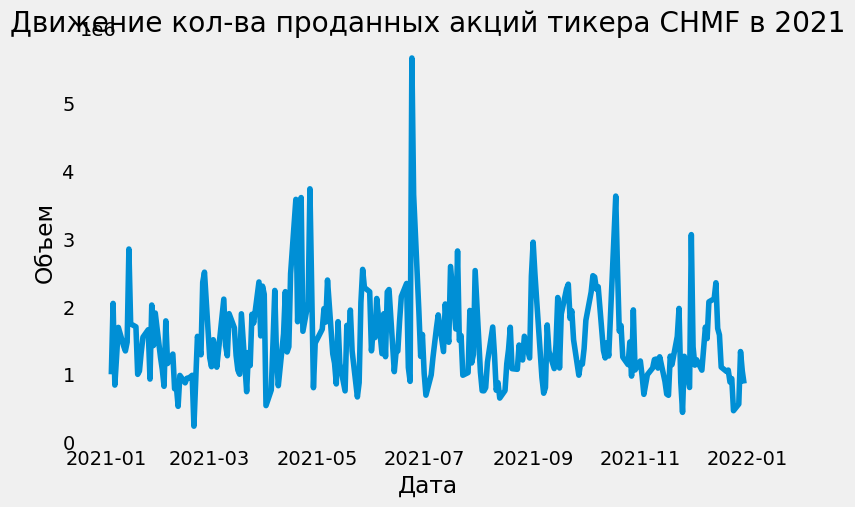

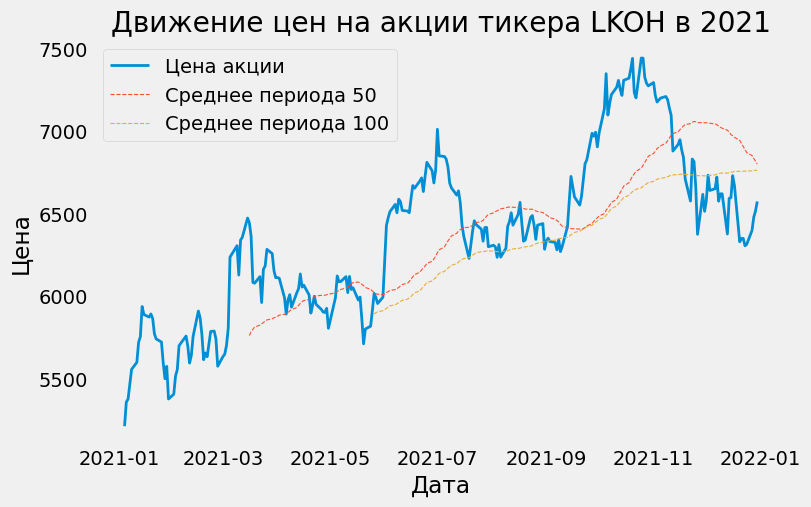

...

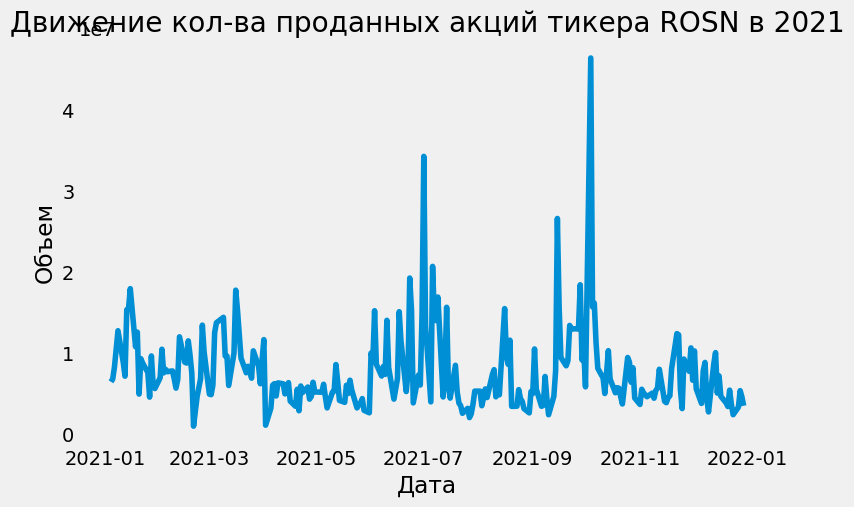

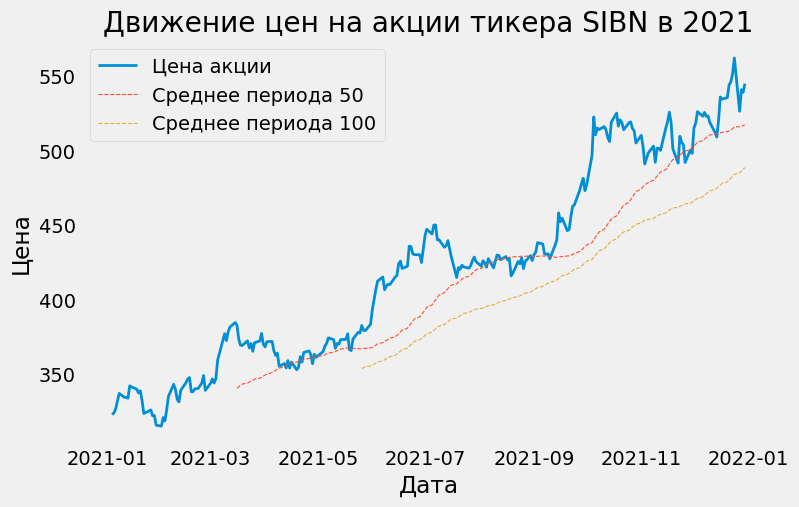

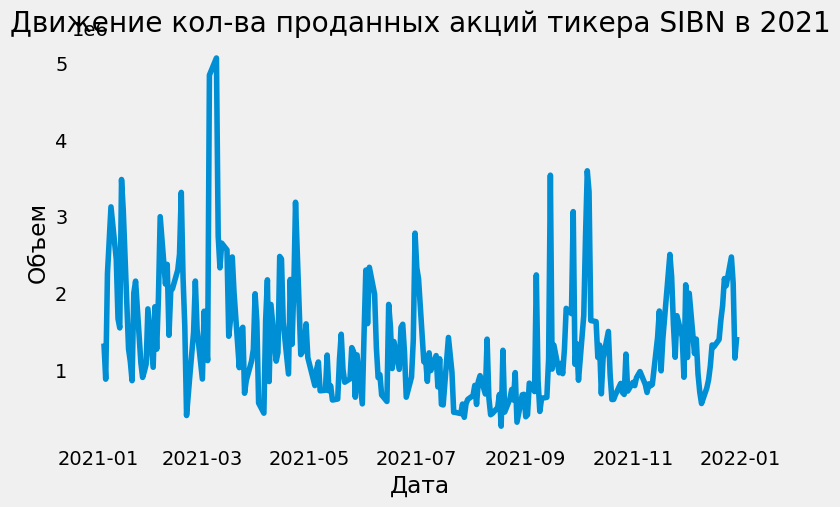

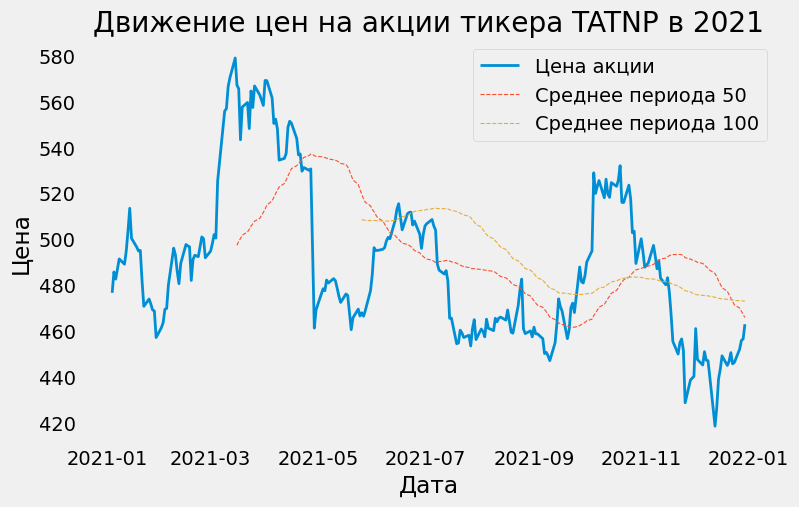

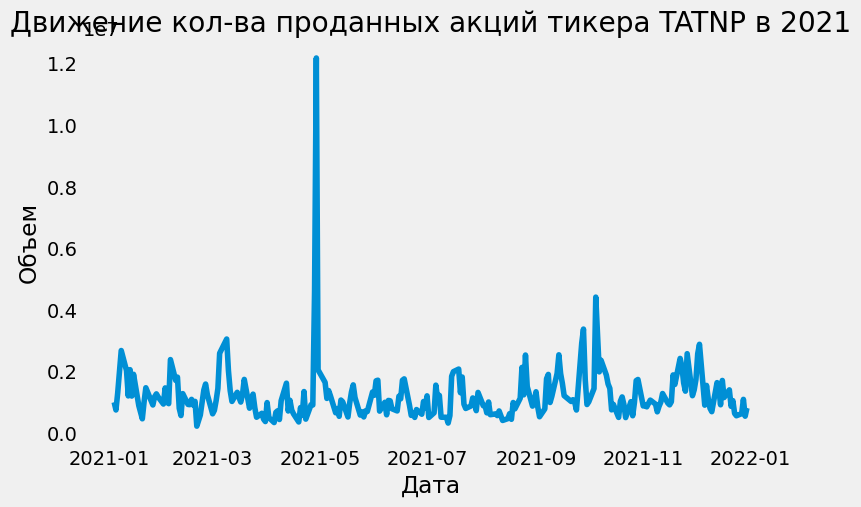

In [26]:
for i in company_name:
    vol(i, 2021)

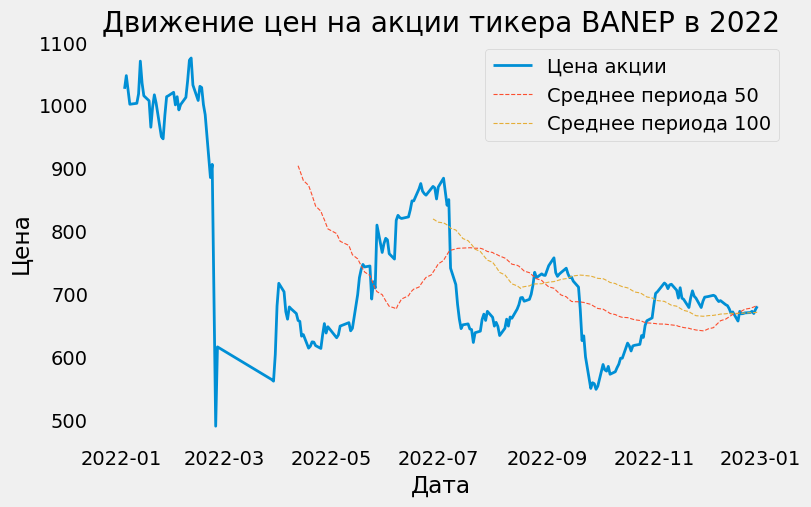

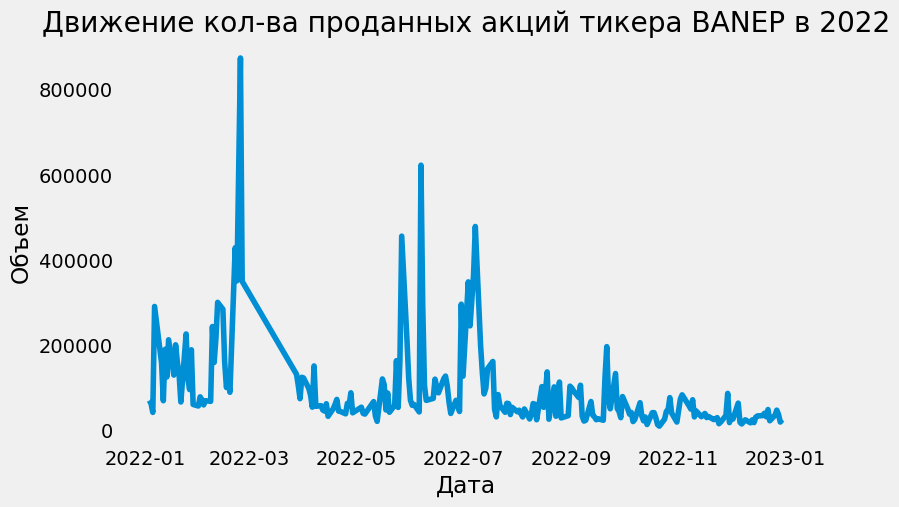

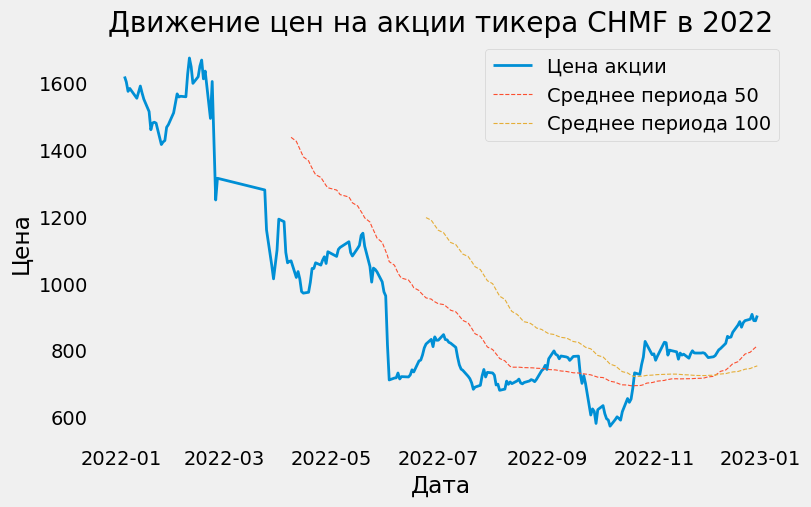

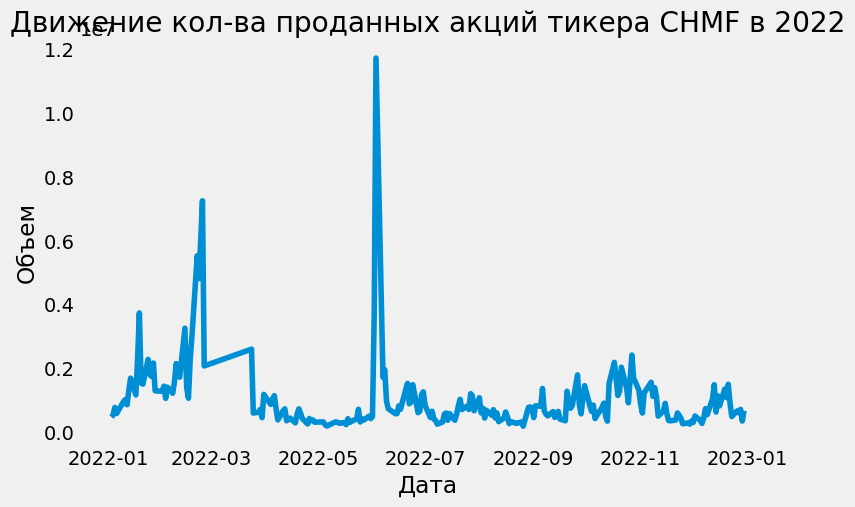

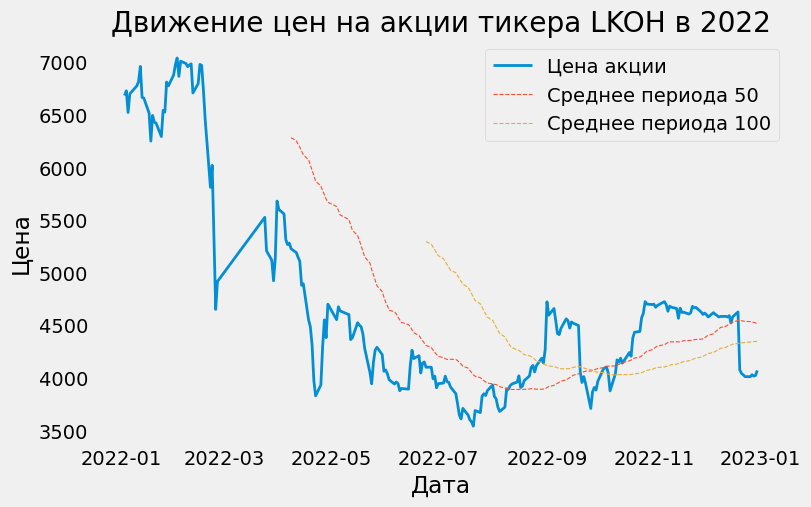

...

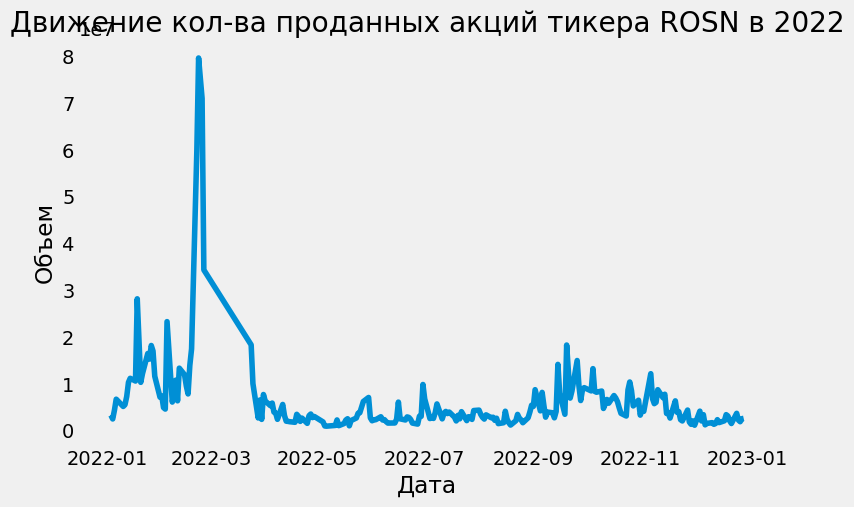

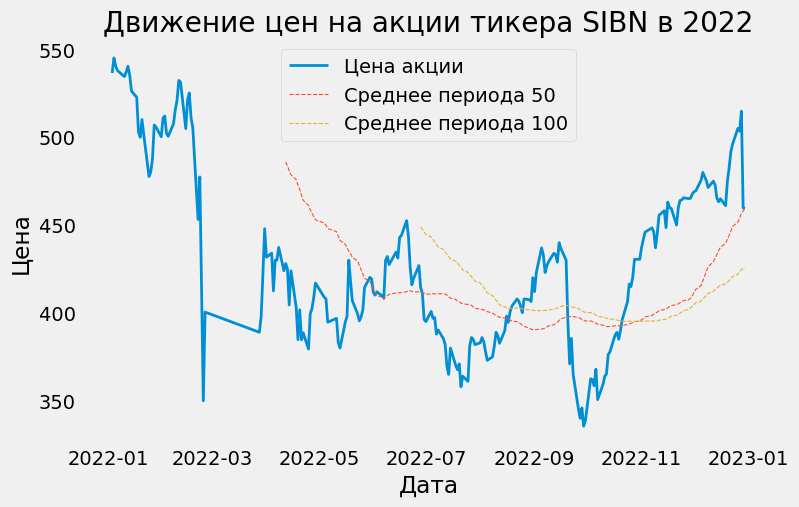

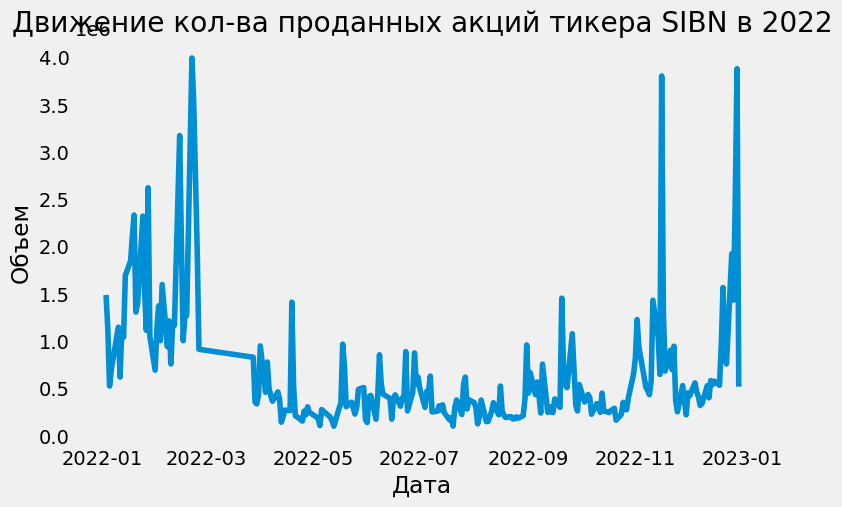

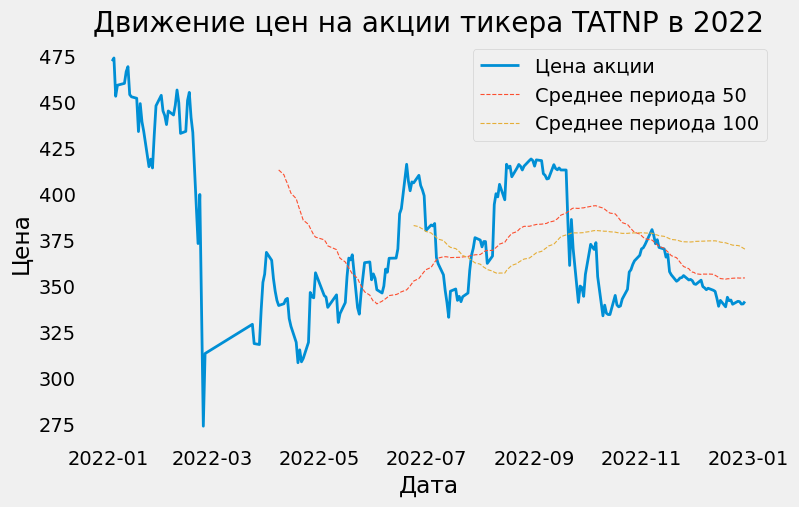

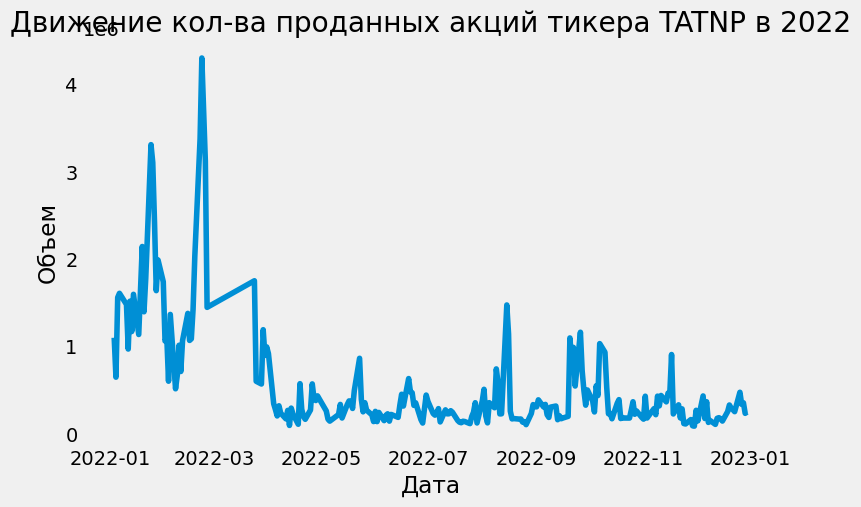

In [27]:
for i in company_name:
    vol(i, 2022)

Таким образом, рассмотрев поближе динамику акций нефтегазовых компаний в 2022 годму, можно заметить следующее:
* Скачки в объеме торгов более "яркие", выделяющиеся среди остальных значений. Также в целом кол-во проданных акций будто имеет нисходящий тренд
* Сильнее всего выделяются акции тикеров SIBN и TATNP и(т.е. Газпром Нефти и Татнефти), так как после падения цены цена акций упала, а объем торгов остался приблизительно на одном уровне без особых скачков, что, вполне возможно,  связано с лояльностью инвесторов.

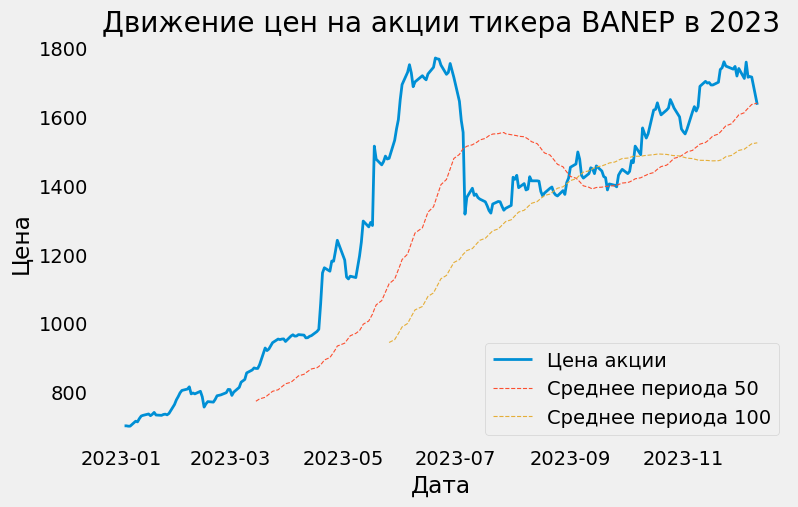

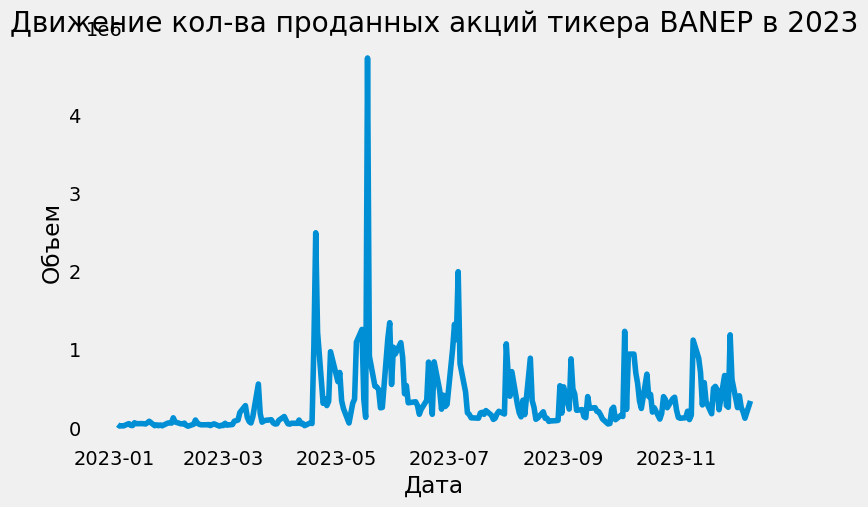

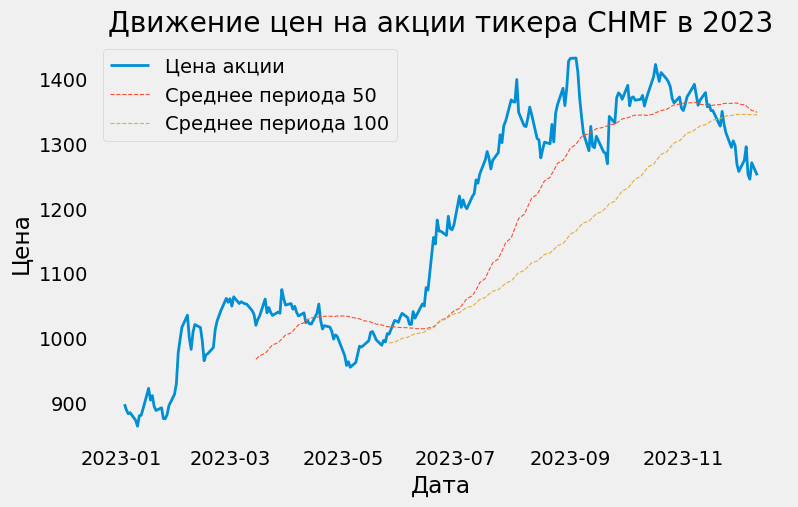

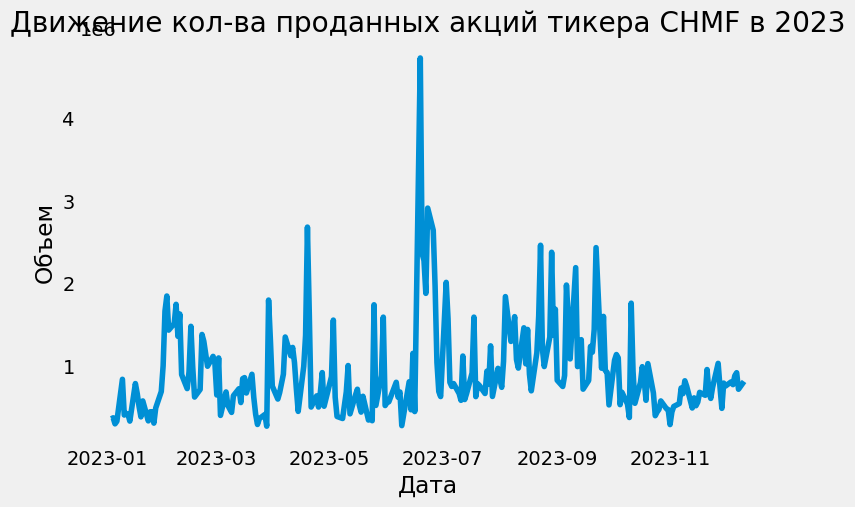

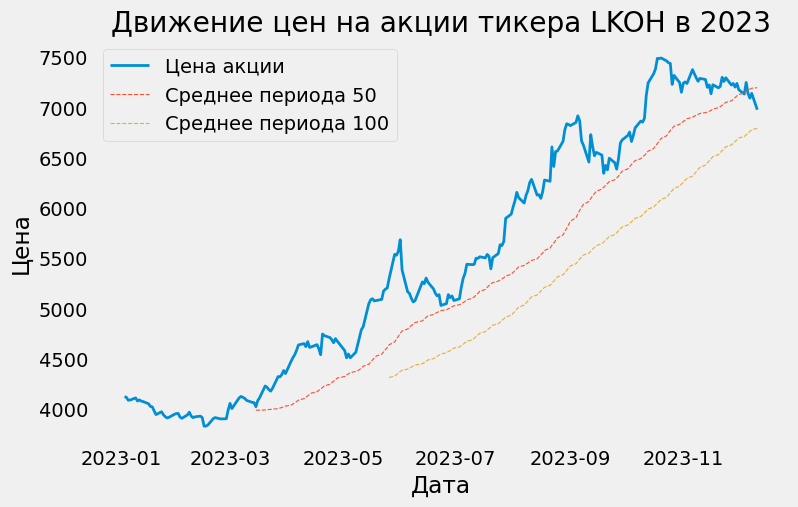

...

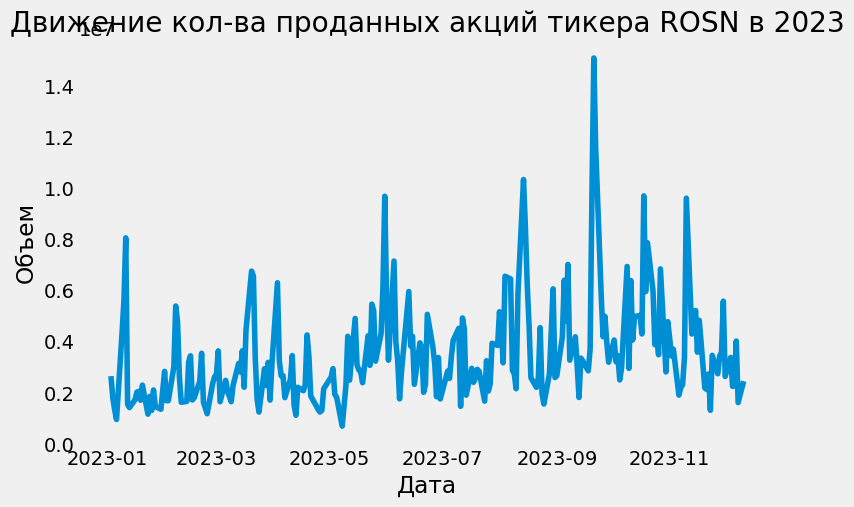

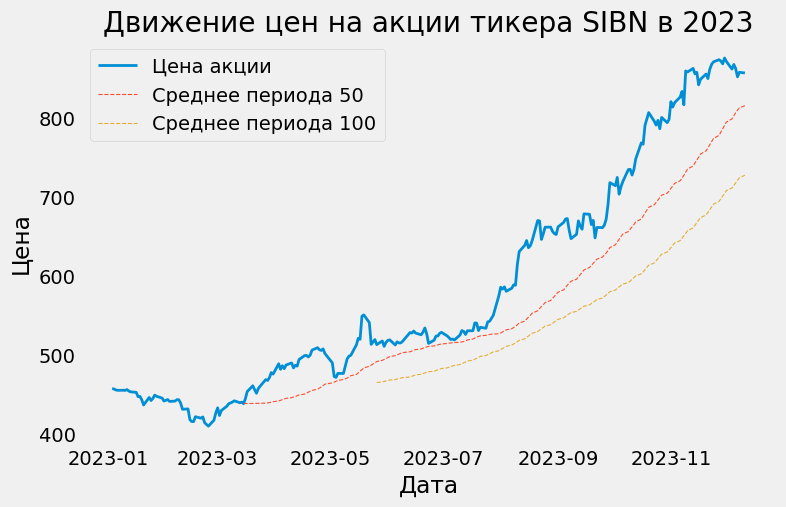

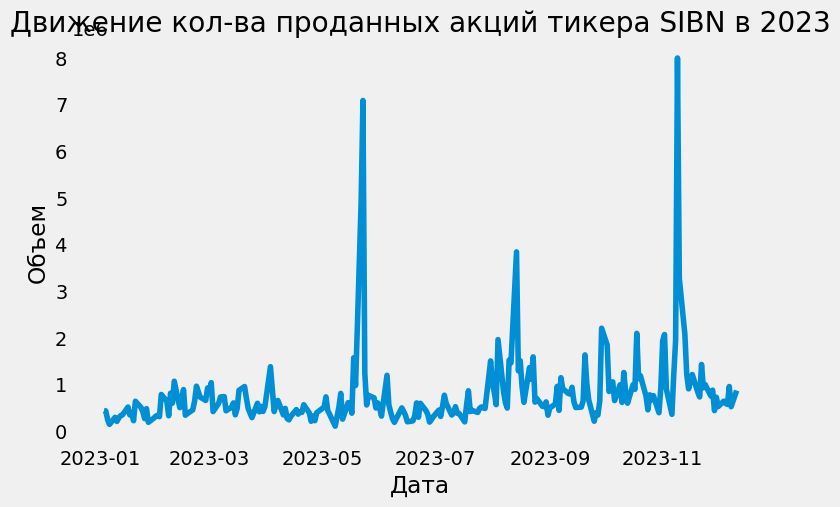

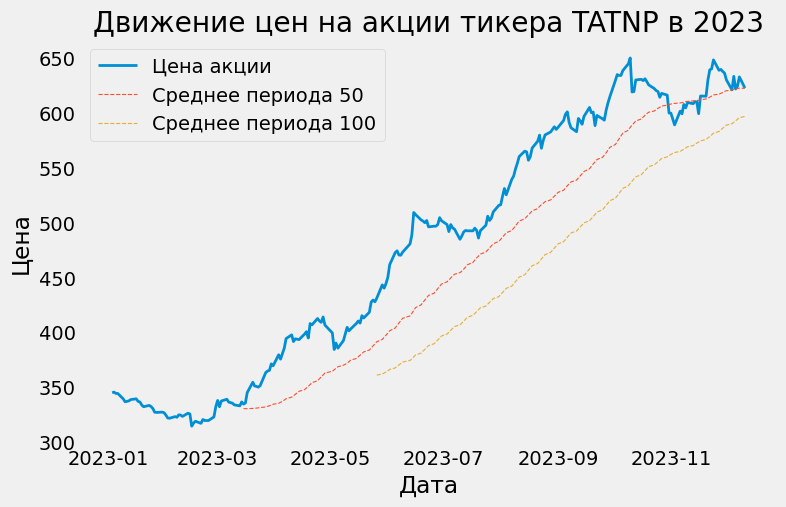

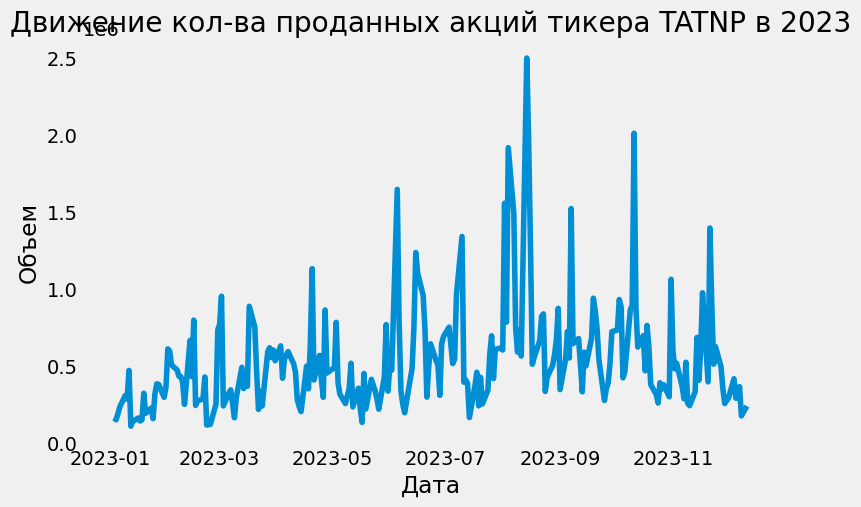

In [28]:
for i in company_name:
    vol(i, 2023)

В принципе, 2023 год довольно благоприятный - цены акций растут, в динамике объемов торгов все еще присутствуют местами значительные колебания.

Например, по привилегированным акциям Башнефти, в частности, после одобрения акционерами на собрании 21 июня, были выплачены дивиденды в размере 199,89 руб на бумагу с текущей доходностью около 12,15% – наиболее высокой среди российских эмитентов. Как можно заметить, в этот период как раз таки возросло количество проданных акций тикера. 

Также 4 июня 2023 года стало известно решение ОПЕК+ по квотам на добычу нефти, которое повлияло на товарный рынок и стоимость акций нефтегазового сектора

<a id="4"></a> <br>
# 4. Добавлю экспоненциальные скользящие средние для каждого тикера с периодом 50.

**Экспоненциальное скользящее среднеее** - тип скользящего среднего, придающий больший вес недавним наблюдениям - он может быстрее фиксировать последние тенденции

Мы можем использовать функцию pandas.DataFrame.ewm() для вычисления экспоненциально взвешенной скользящей средней за определенное количество предыдущих периодов.

In [29]:
def exp_mov_av(name):
    data = pd.DataFrame(df[df['ticker'] == name][['date', 'close']]).dropna()
    data.set_index('date', inplace=True)
    data['ewm'] = data['close'].ewm(span=50, adjust=False).mean()
    print(data.head())
    plt.figure(figsize=(10, 5))
    title = f"Экспоненциальная статистика среднего значения для тикера {name}"
    ax = data['ewm'].plot(title=title, lw=0.8)
    data['close'].plot(ax=ax, lw=1.5)
    plt.show()
    

             close          ewm
date                           
2020-12-10  1225.5  1225.500000
2020-12-11  1221.0  1225.323529
2020-12-14  1215.0  1224.918685
2020-12-15  1216.5  1224.588541
2020-12-16  1205.0  1223.820363


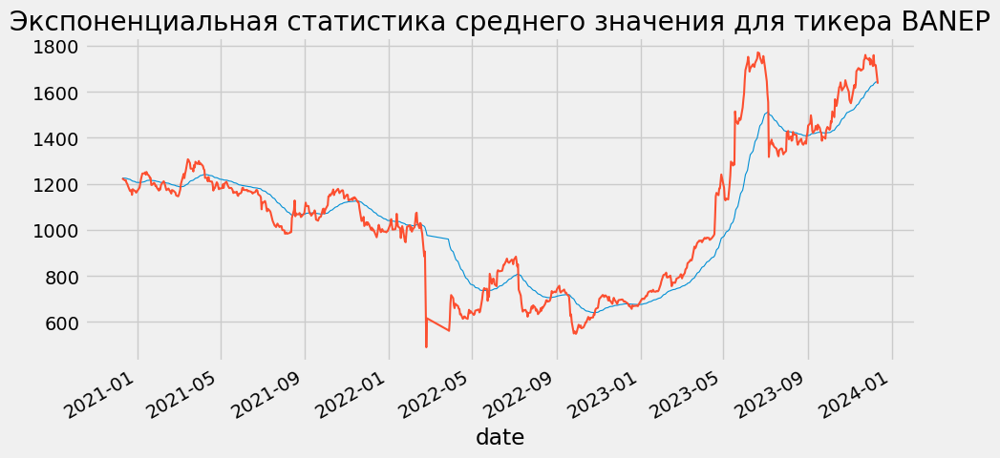

             close          ewm
date                           
2020-12-10  1204.0  1204.000000
2020-12-11  1224.6  1204.807843
2020-12-14  1268.6  1207.309496
2020-12-15  1267.0  1209.650300
2020-12-16  1269.0  1211.977740


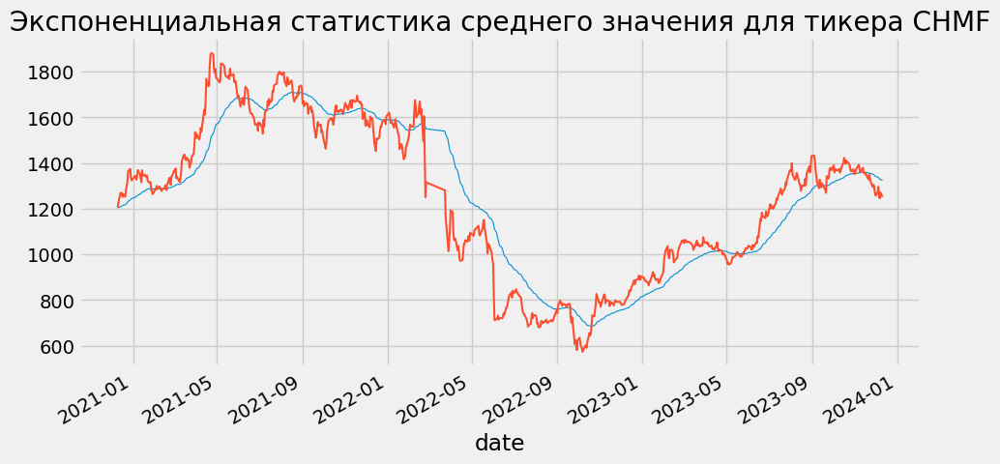

             close          ewm
date                           
2020-12-10  5287.0  5287.000000
2020-12-11  5380.0  5290.647059
2020-12-14  5325.0  5291.994233
2020-12-15  5297.5  5292.210145
2020-12-16  5174.0  5287.574453


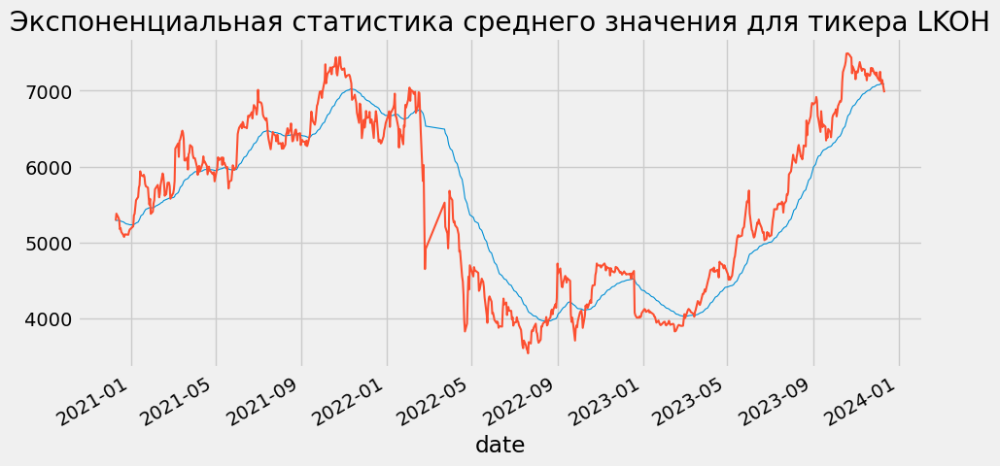

             close         ewm
date                          
2020-12-10  450.90  450.900000
2020-12-11  447.25  450.756863
2020-12-14  441.80  450.405613
2020-12-15  451.50  450.448530
2020-12-16  444.40  450.211333


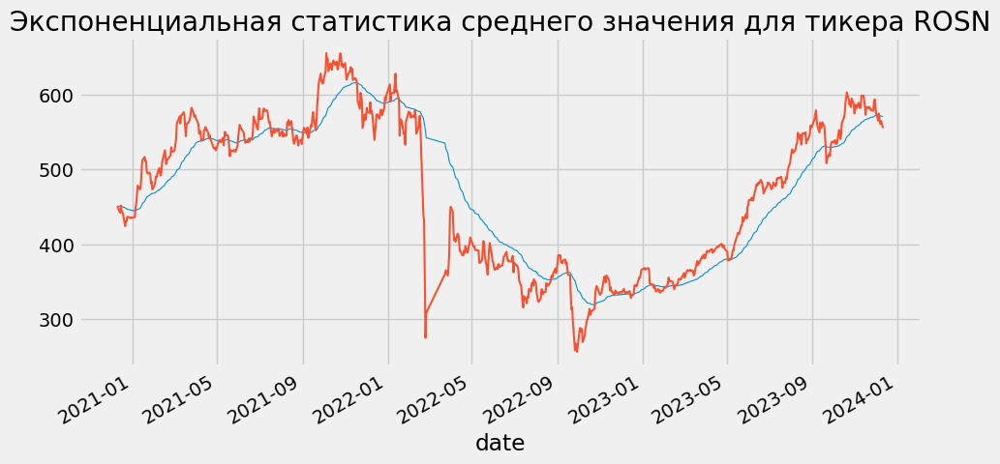

             close         ewm
date                          
2020-12-10  324.55  324.550000
2020-12-11  328.00  324.685294
2020-12-14  325.50  324.717243
2020-12-15  326.45  324.785195
2020-12-16  327.80  324.903422


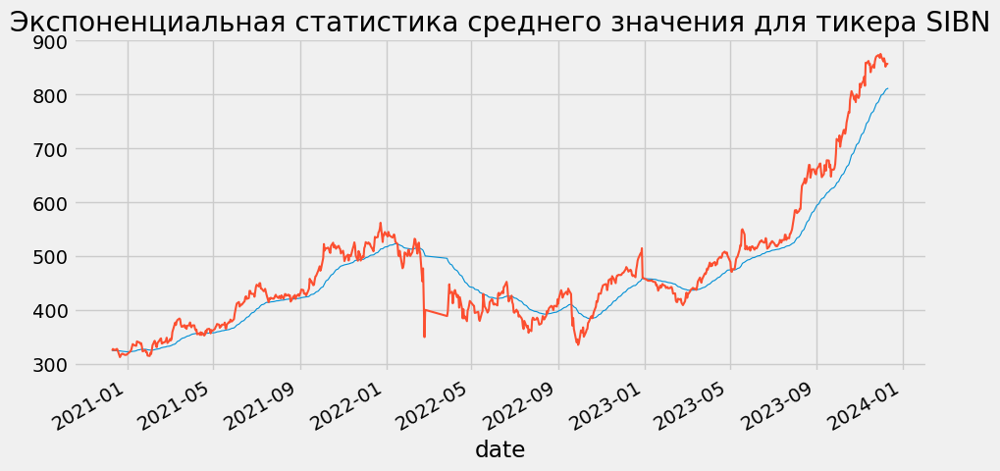

            close         ewm
date                         
2020-12-10  475.4  475.400000
2020-12-11  479.0  475.541176
2020-12-14  483.9  475.868973
2020-12-15  485.5  476.246661
2020-12-16  478.0  476.315419


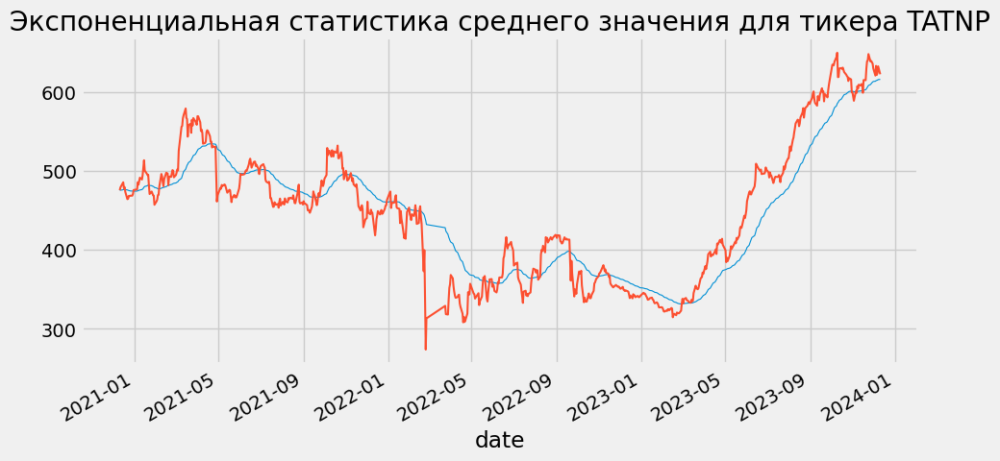

In [30]:
for i in company_name:
    exp_mov_av(i)

Так как EMA(exponential moving average) придают больший вес свежим данным, они более чувствительны к последним изменениям цен по сравнению с простыми скользящими статистиками, что делает результат более своевременным, поэтому данный метод более предпочтительный по ср-ю с другими(помимо EMA, SMA есть CMA - кумулятивная кользящая средняя)

<a id="5"></a> <br>
# 5. Осуществлю расчет индикатора RSI. 

*RSI - Relative Strength Index - индекс относительной силы,* </br>
    который строится на основании расчета относительной скорости изменения котировок актива на заданном периоде. Инструмент применяется на любых финансовых рынках - фондовом, валютном, срочном, товарно-сырьевом и т. д. 

Он позволяет проанализировать движение цены в прошлом и дать прогнозы поведения рынка в будущем, и на основании этого анализа участники торгов выявляют периоды тренда, получают сигналы на вход в рынок и закрытие позиций

Его значения колеблятся в промежутке [0, 100], и значение в середине показывает: средний рост цены сравнялся со ср. величиной падения,

* Воспользуемся пакетом **Cufflinks**, который содержит функции для финансовых диаграмм и отображения финансовых индикаторов, как RSI </br>

Для этого создадим постоянный объект QuantFig

In [31]:
df.head()

,ticker,date,open,high,low,close,vol,year
0,BANEP,2020-12-10,1214.5,1229.5,1212.0,1225.5,67116,2020
1,BANEP,2020-12-11,1228.5,1234.0,1218.5,1221.0,61651,2020
2,BANEP,2020-12-14,1225.0,1230.5,1215.0,1215.0,89688,2020
3,BANEP,2020-12-15,1218.5,1221.5,1212.0,1216.5,67263,2020
4,BANEP,2020-12-16,1213.0,1219.5,1202.5,1205.0,80695,2020


In [32]:
import cufflinks as cf
import plotly.offline as plyo
plyo.init_notebook_mode(connected=True)

In [33]:
for i in company_name:
    df_banep = df[df['ticker'] == i]
    quotes = df_banep[['date', 'open', 'high', 'low', 'close']]
    quotes.set_index('date', inplace=True)
    qf = cf.QuantFig(
        quotes,
        title=f"Валютный курс {i}",
        legend='top',
    )
    qf.add_rsi(periods=14, # стандартный период, к-й обычно берут
              showbands=False)
    plyo.iplot(
        qf.iplot(asFigure=True))
    

Это отличная библиотека, чтобы визуализировать RSI, но все же нужно провести непосредственную рассчетную часть, используя формулу

Можно кстати также использовать библиотеку ta для расчета, но я не хочу

* Если RSI равен 70 или больше, предполагается, что инструмент перекуплен (ситуация, при которой цены выросли больше, чем ожидалось рынком).
* Значение RSI, равное 30 или менее, воспринимается как сигнал о том, что инструмент может быть перепродан (ситуация, при которой цены упали больше, чем ожидалось рынком).
Поэтому я нарисую прямые на этом уровне

In [34]:
def rsi(company, year):
    print(year)
    company_data = df[(df['ticker'] == company) & (df['year'] == year)]
    company_data['price_change'] = company_data['close'].diff()

    company_data['mean_50'] = company_data['close'].ewm(span=14, adjust=False).mean() # эксп средняя
    
    company_data['up'] = company_data['price_change'].apply(lambda x: x if x > 0 else 0) # посмотрим движение цены вверх
    company_data['avg_up'] = company_data['up'].ewm(span=14, adjust=False).mean() # скользящую ср. для положит. значений
    
    company_data['down'] = company_data['price_change'].apply(lambda x: abs(x) if x < 0 else 0) # аналогично для отриц. зн-ий
    company_data['avg_down'] = company_data['down'].ewm(span=14, adjust=False).mean().abs()
    company_data['rsi'] = 100 * company_data['avg_up'] / (company_data['avg_up'] + company_data['avg_down']) 

    fig, ax = plt.subplots()
    sns.lineplot(data=company_data, x='date', y='close', ax=ax, lw=0.8, label='Динамика цены закрытия') 
    sns.lineplot(data=company_data, x='date', y='mean_50', ax=ax, linestyle='--', lw=0.8, label='exp_50') 
    ax.set_title(f"Динамика цены и экспоненциальной скользящей средней для тикера {company}")
    ax.set_xlabel('Дата')
    ax.set_ylabel('Цена')
    ax.grid()
    ax.legend()

    # визуализируем 
    plt.figure(figsize=(8, 2))
    ax2 = sns.lineplot(data=company_data, x='date', y='rsi') # график динамики rsi
   
    ax2.axhline(y=70, color='red', linestyle='--', linewidth=1)
    ax2.axhline(y=30, color='red', linestyle='--', linewidth=1)
    ax2.set_title(f'Динамика RSI по тикеру {i} за {year}')
    ax2.set_ylabel('RSI')
    ax2.set_xlabel('Дата')
    ax2.grid()

    plt.show()


2021


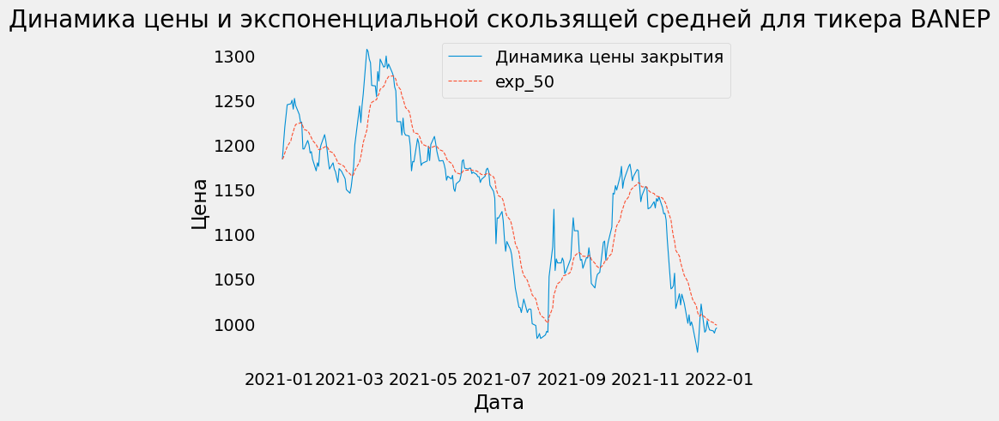

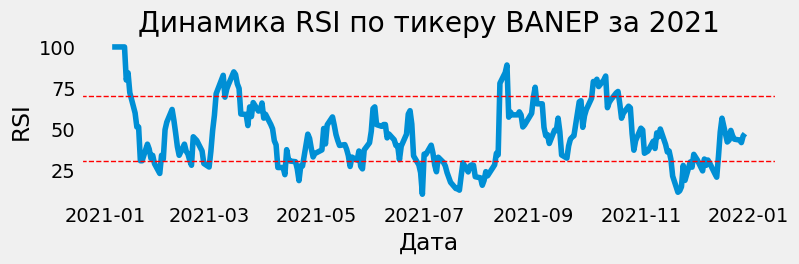

2021


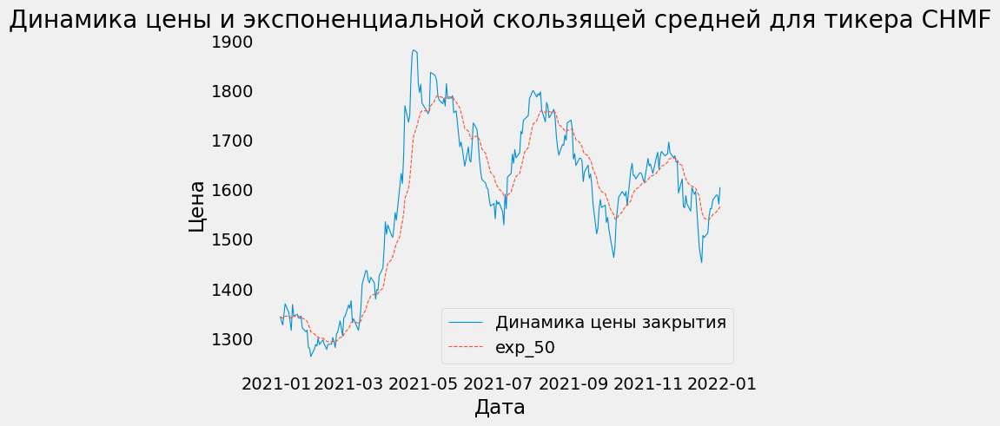

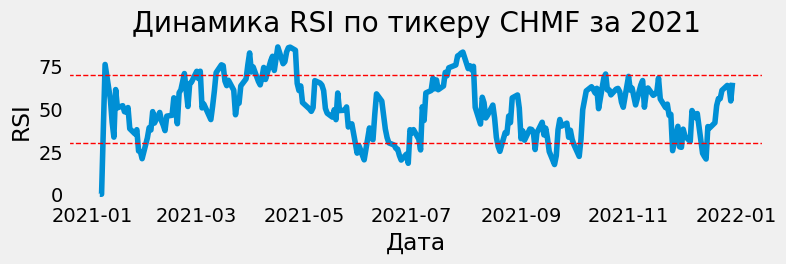

2021


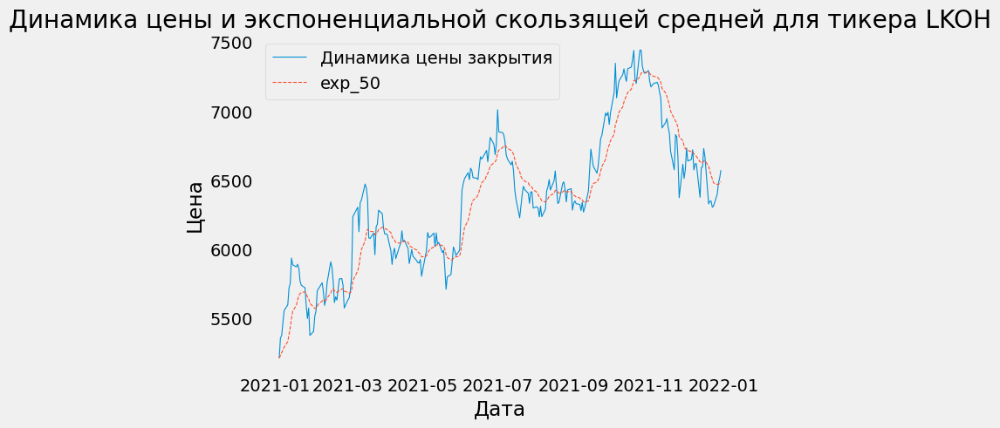

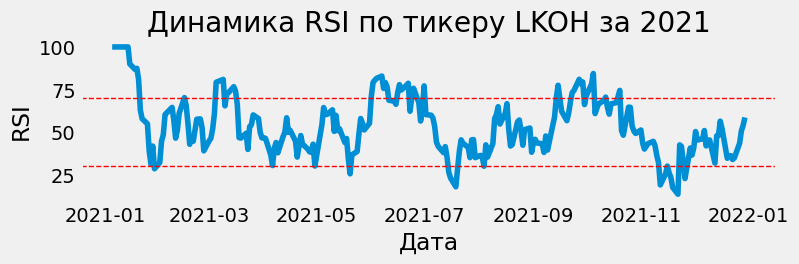

2021


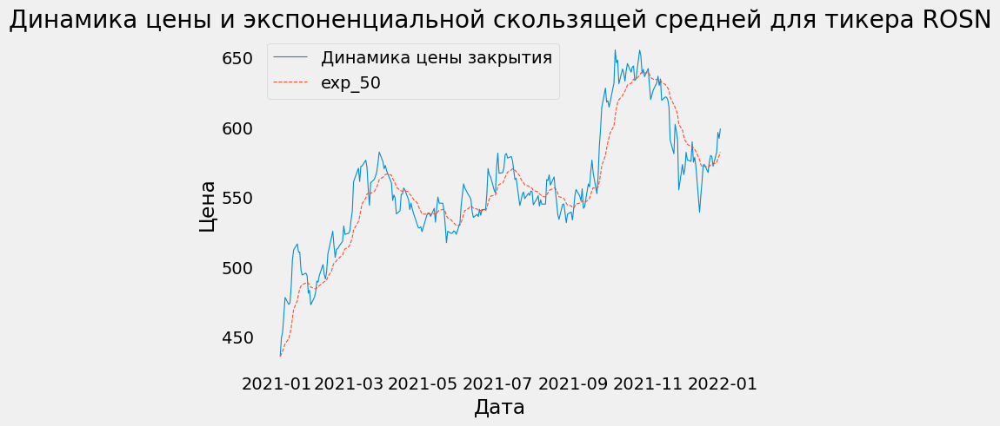

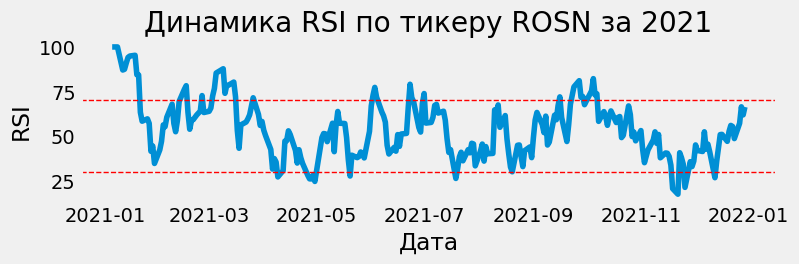

2021


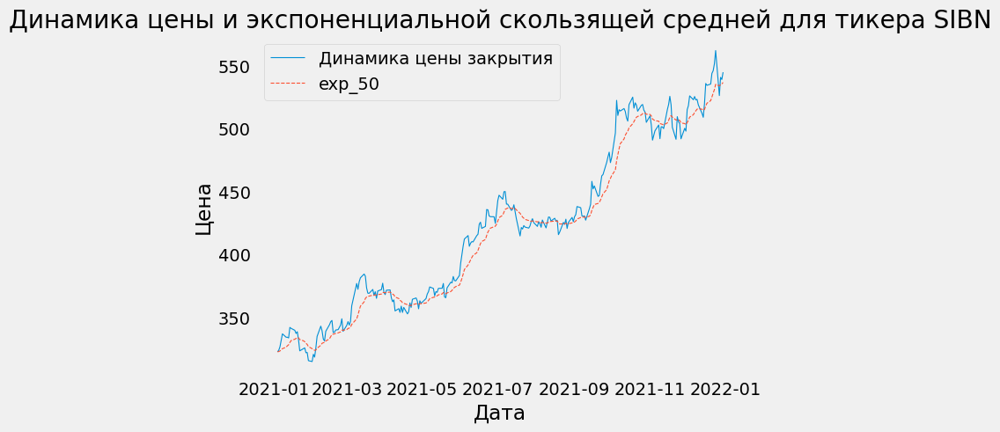

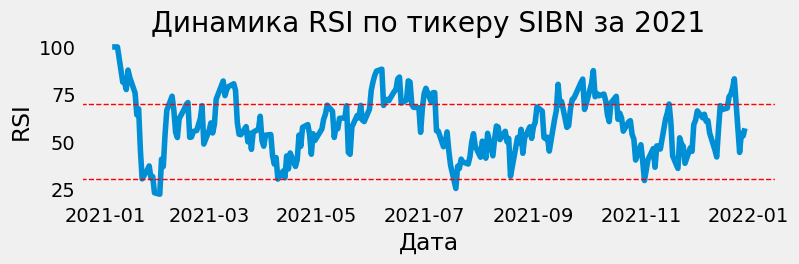

2021


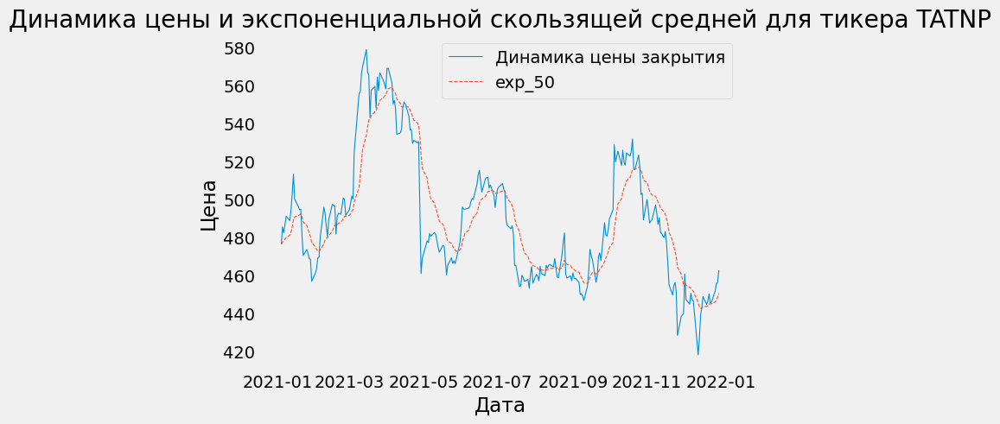

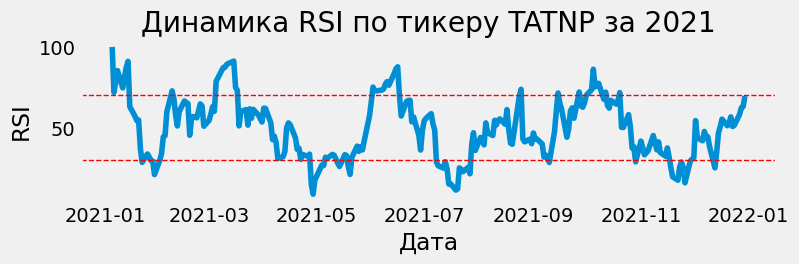

In [35]:
for i in company_name:
    rsi(i, 2021) # снова 21, т.к. в 2020 г. данные только за декабрь

Интересно: распространенным сигналом RSI является дивергенция:

* Если цена делает два возрастающих максимума на вершине тернда, а RSI демонстрирует их снижение, это явный признак, что рост цены замедляется и новый максимум сфомировался не столько за счет притока покупаетелей, сколько из-за отсутствия продавцов

можно наблюдать это на примере Башнефти в октябре 2021 года: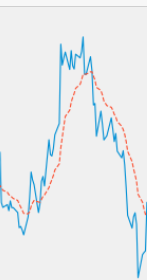
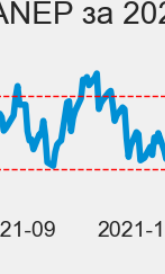

В данный период можно заметить увеличение RSI, и два возрастающих максимума присутствует, т.е. локальный максимум получается за счет притока покупателей(и возможно за счет других признаков). Можно найти обратную ситуацию, если более детально рассмотреть графики динамики, а мы пойдем далее

2022


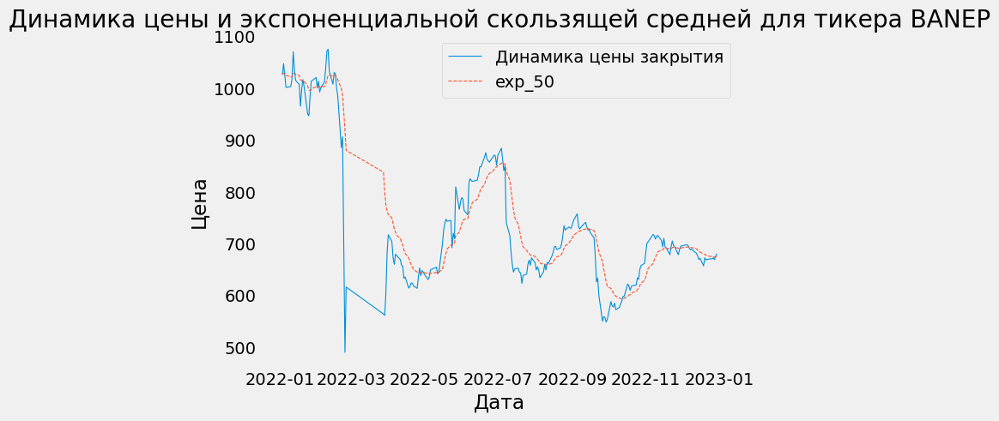

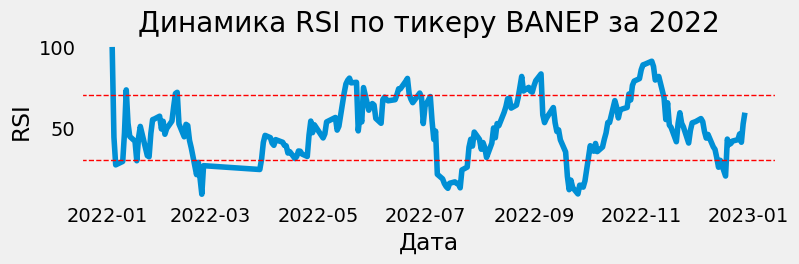

2022


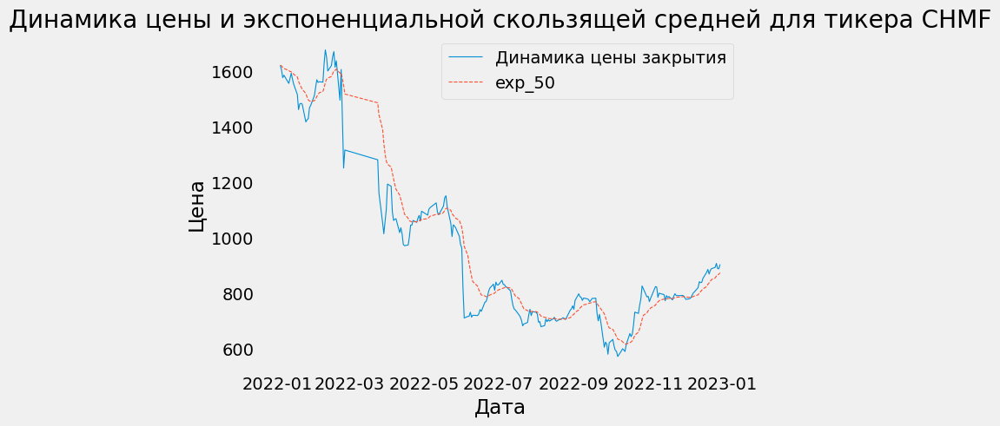

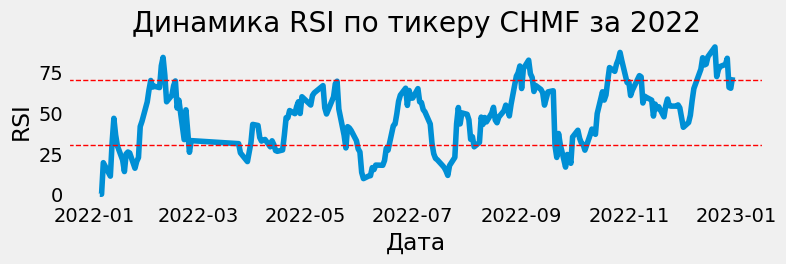

2022


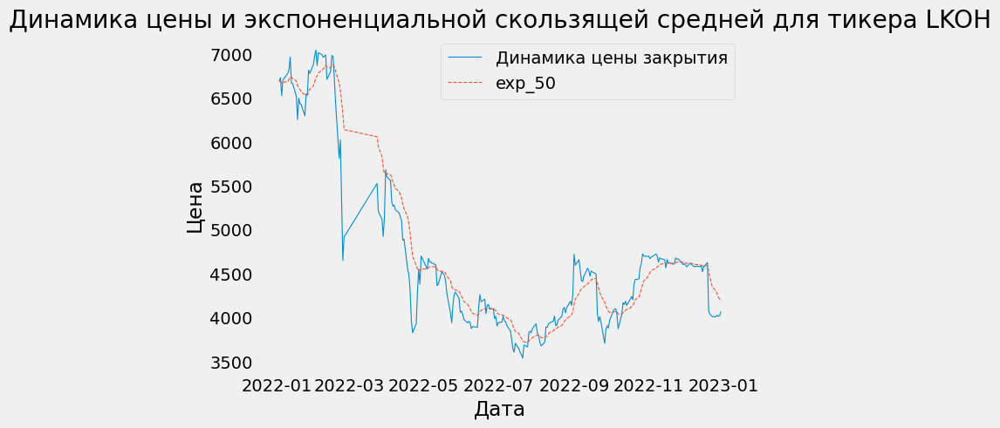

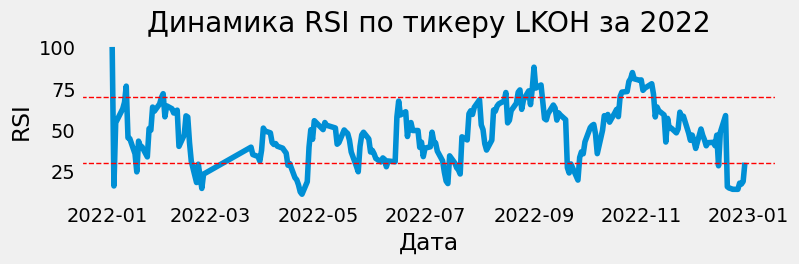

2022


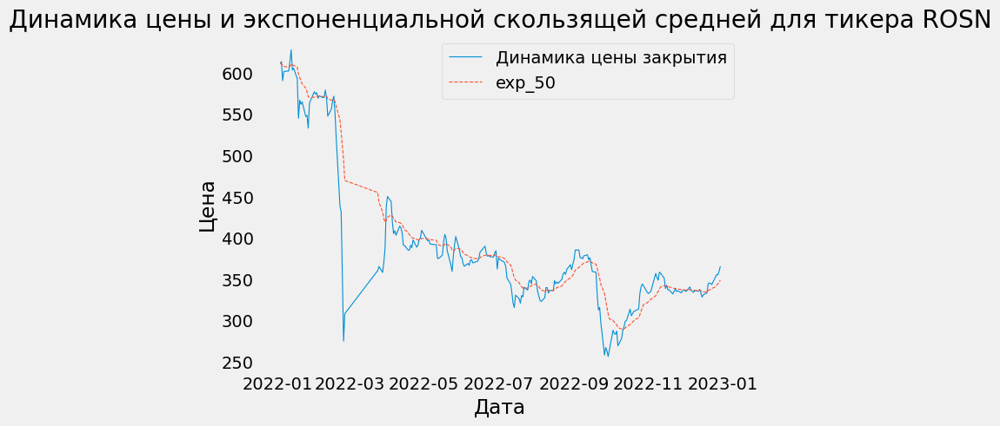

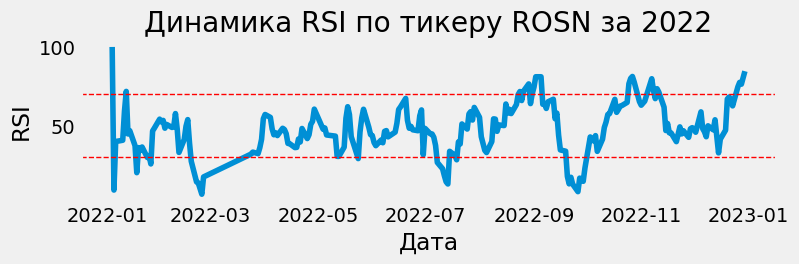

2022


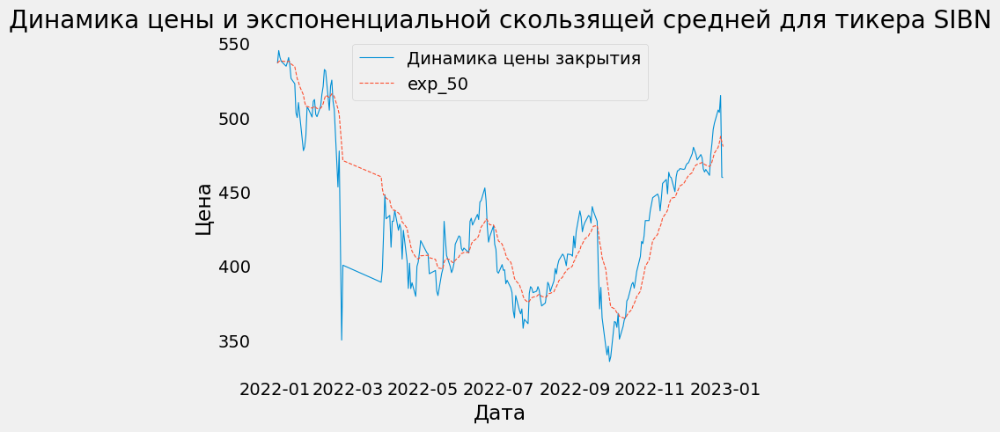

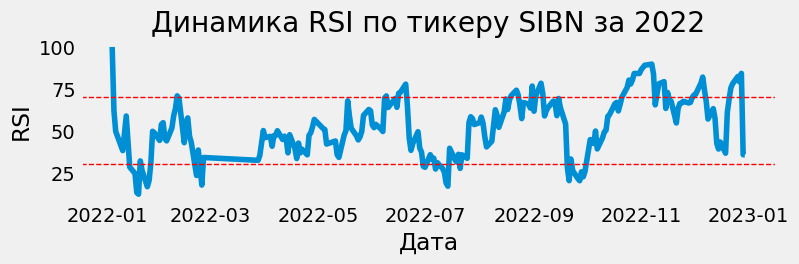

2022


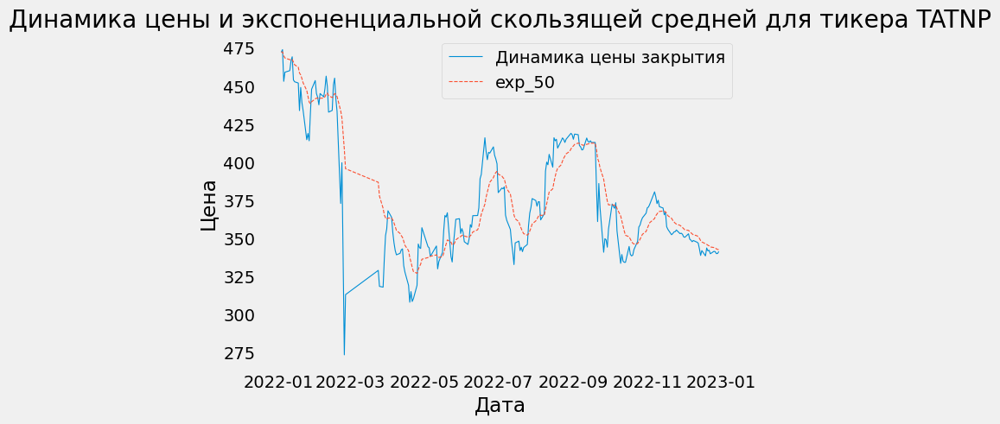

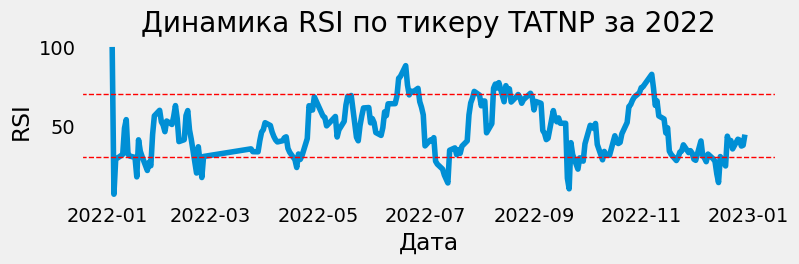

In [36]:
for i in company_name:
    rsi(i, 2022)

2023


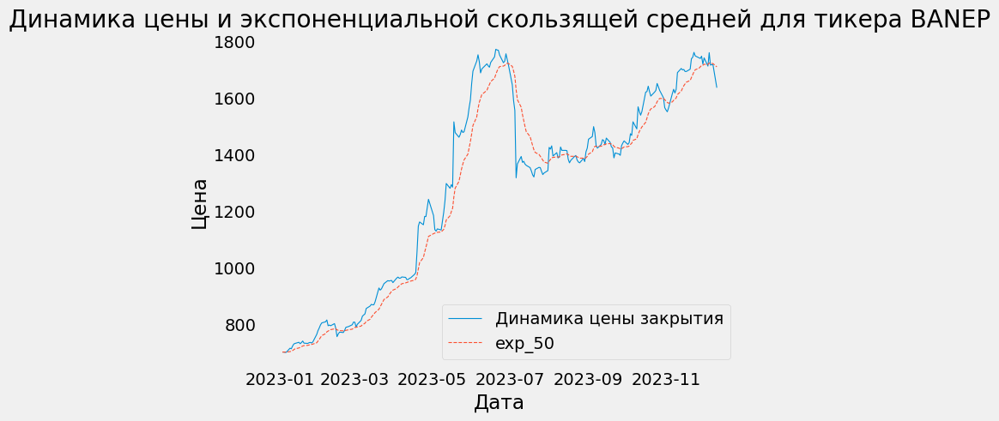

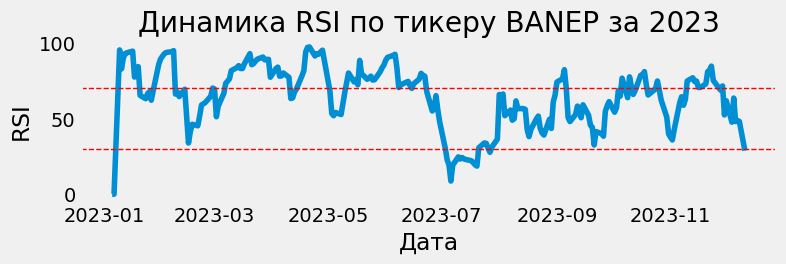

2023


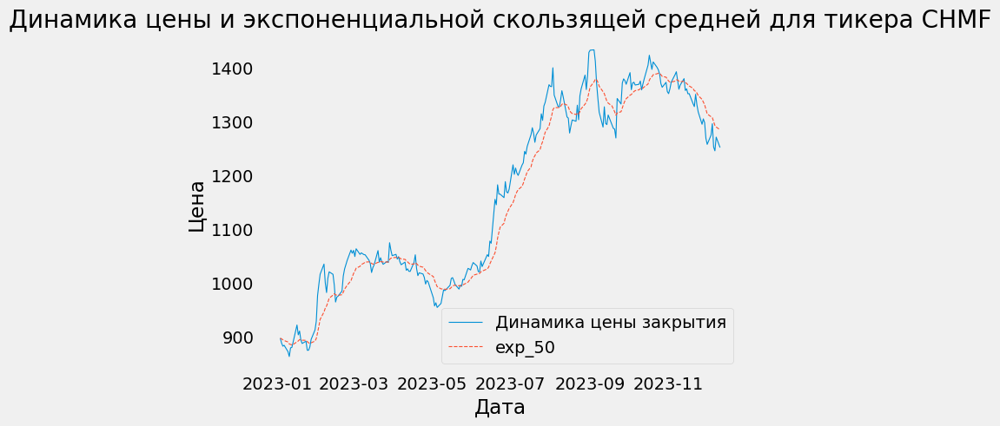

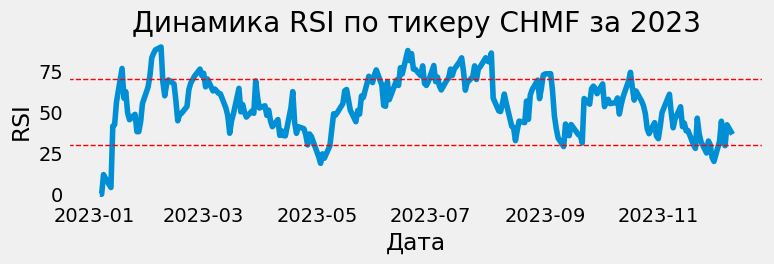

2023


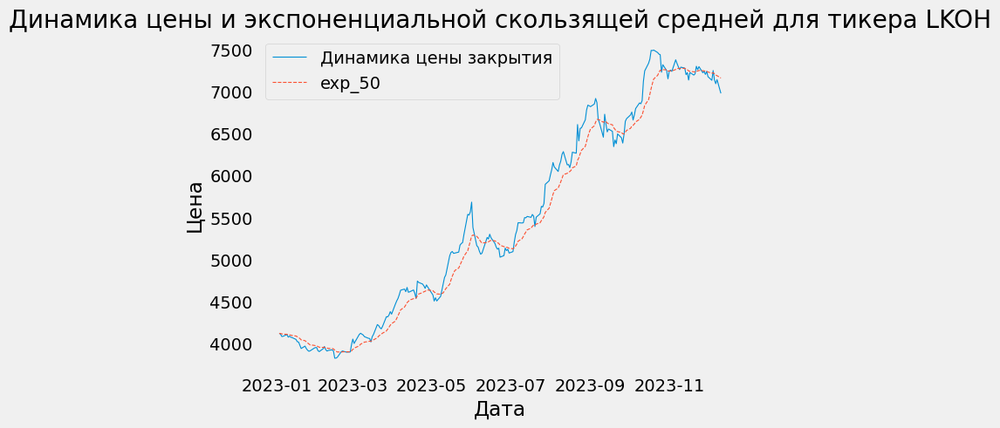

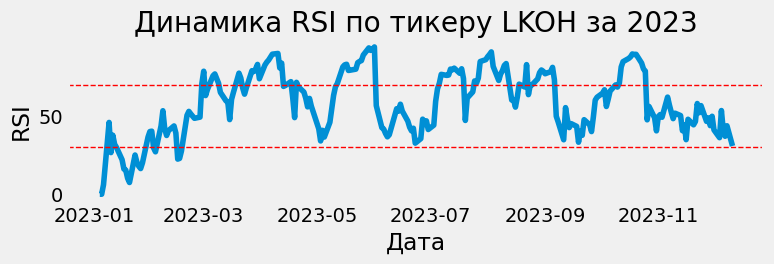

2023


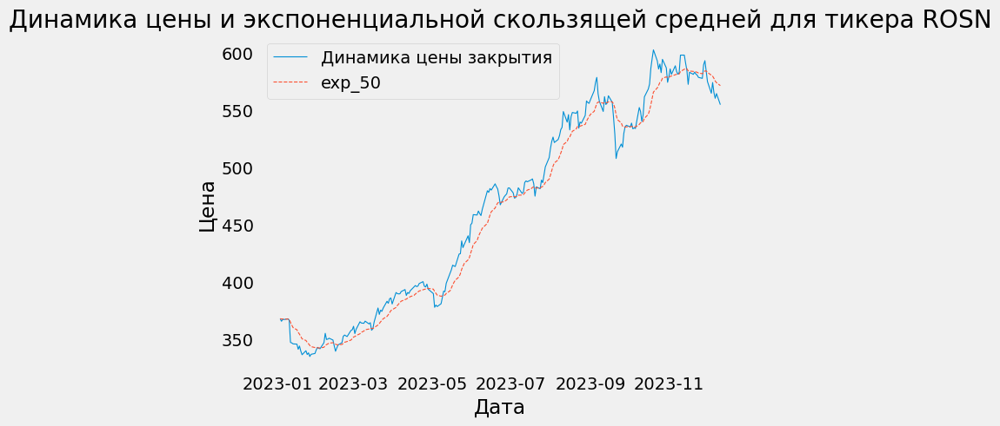

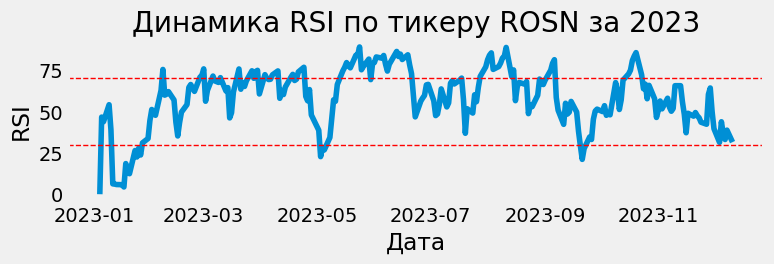

2023


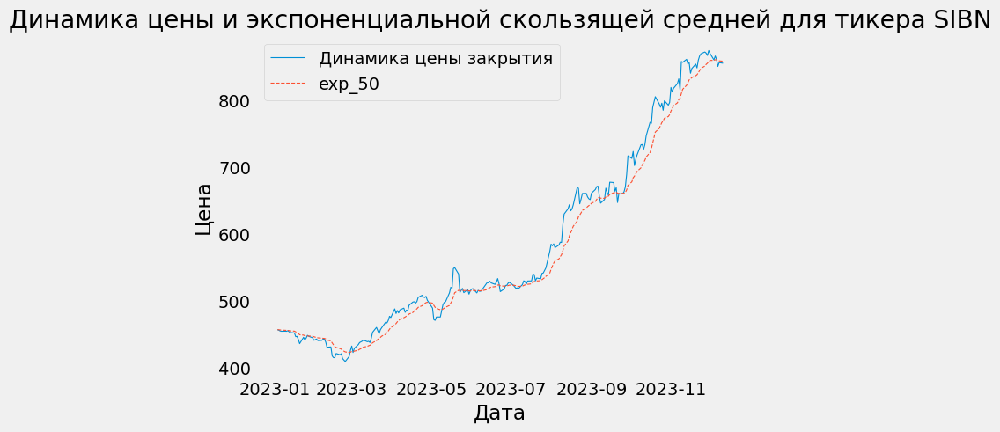

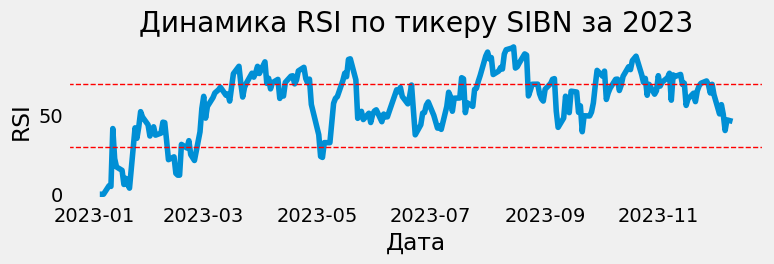

2023


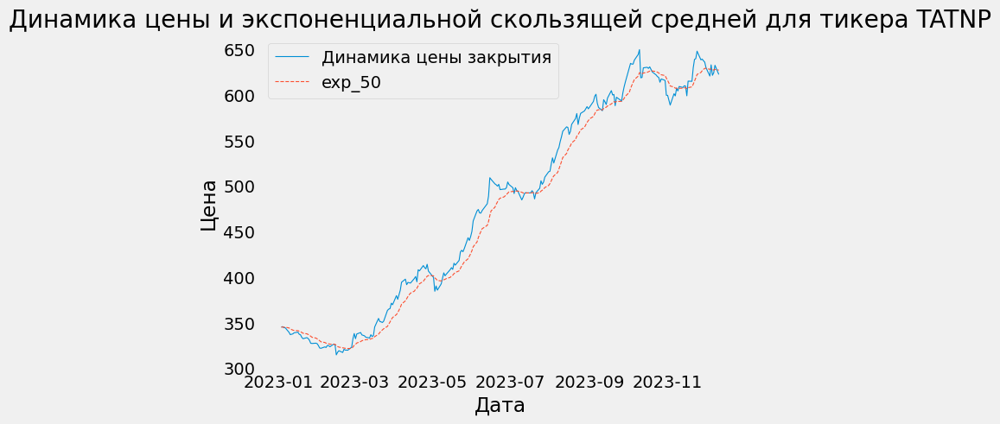

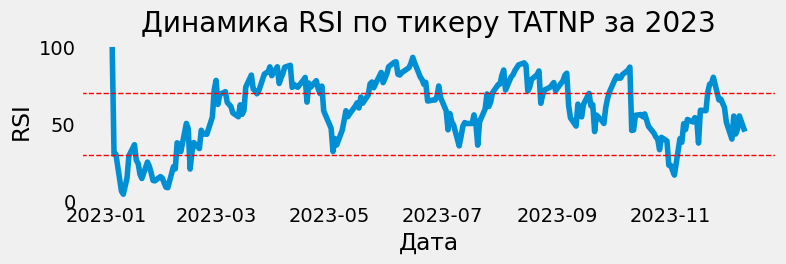

In [37]:
for i in company_name:
    rsi(i, 2023)

Можно заметить, что в нынешнем году в основном RSI был либо в голубой зоне, либо скачки были выше уровня 70. Возможно, это говорит о бычьем настроении на рынке, т.е. и о росте акции

<a id="6"></a> <br>
# 6. Модель прогноза цены акции

По сути, инвестору важно направление прогноза цены акции..т.е. взлетит цена или наоборот.

Поэтому сначала я разработаю модель для этого

In [38]:
df.set_index('date', inplace=True)
df.head()

,ticker,open,high,low,close,vol,year
date,,,,,,,
2020-12-10,BANEP,1214.5,1229.5,1212.0,1225.5,67116,2020
2020-12-11,BANEP,1228.5,1234.0,1218.5,1221.0,61651,2020
2020-12-14,BANEP,1225.0,1230.5,1215.0,1215.0,89688,2020
2020-12-15,BANEP,1218.5,1221.5,1212.0,1216.5,67263,2020
2020-12-16,BANEP,1213.0,1219.5,1202.5,1205.0,80695,2020


In [39]:
df1 = df.copy(deep=True) # ну на всякий глуб. копию сделаю

In [40]:
df1 = df1.query("ticker == 'BANEP'")

In [41]:
df1.head()

,ticker,open,high,low,close,vol,year
date,,,,,,,
2020-12-10,BANEP,1214.5,1229.5,1212.0,1225.5,67116,2020
2020-12-11,BANEP,1228.5,1234.0,1218.5,1221.0,61651,2020
2020-12-14,BANEP,1225.0,1230.5,1215.0,1215.0,89688,2020
2020-12-15,BANEP,1218.5,1221.5,1212.0,1216.5,67263,2020
2020-12-16,BANEP,1213.0,1219.5,1202.5,1205.0,80695,2020


In [42]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
open,742.0,1063.892183,314.702998,538.0,750.500,1069.0,1227.125,1802.0
high,742.0,1078.180593,317.647527,563.0,773.125,1083.5,1243.000,1899.0
low,742.0,1047.929245,311.613691,338.5,736.625,1057.0,1212.000,1751.0
close,742.0,1062.969003,314.392796,490.0,755.500,1070.5,1225.500,1771.5
vol,742.0,174610.882749,296985.210031,8132.0,48541.250,83004.5,166844.750,4724336.0
year,742.0,2021.939353,0.863310,2020.0,2021.000,2022.0,2023.000,2023.0


In [43]:
del df1['ticker']
df1.head()

,open,high,low,close,vol,year
date,,,,,,
2020-12-10,1214.5,1229.5,1212.0,1225.5,67116,2020
2020-12-11,1228.5,1234.0,1218.5,1221.0,61651,2020
2020-12-14,1225.0,1230.5,1215.0,1215.0,89688,2020
2020-12-15,1218.5,1221.5,1212.0,1216.5,67263,2020
2020-12-16,1213.0,1219.5,1202.5,1205.0,80695,2020


In [44]:
df1['tomorrow'] = df1['close'].shift(-1) # т.е. теперь цена сл дня будет

In [45]:
df1

,open,high,low,close,vol,year,tomorrow
date,,,,,,,
2020-12-10,1214.5,1229.5,1212.0,1225.5,67116,2020,1221.0
2020-12-11,1228.5,1234.0,1218.5,1221.0,61651,2020,1215.0
2020-12-14,1225.0,1230.5,1215.0,1215.0,89688,2020,1216.5
2020-12-15,1218.5,1221.5,1212.0,1216.5,67263,2020,1205.0
2020-12-16,1213.0,1219.5,1202.5,1205.0,80695,2020,1201.0
...,...,...,...,...,...,...,...
2023-12-05,1714.5,1760.5,1711.0,1759.5,404864,2023,1715.5
2023-12-06,1760.5,1766.5,1715.0,1715.5,253839,2023,1717.5
2023-12-07,1718.0,1728.5,1700.0,1717.5,199515,2023,1716.0


In [46]:
df1['target'] = (df1['tomorrow'] > df1['close']).astype(int)

In [47]:
df1 # это то, что мы постараемся предсказать

,open,high,low,close,vol,year,tomorrow,target
date,,,,,,,,
2020-12-10,1214.5,1229.5,1212.0,1225.5,67116,2020,1221.0,0
2020-12-11,1228.5,1234.0,1218.5,1221.0,61651,2020,1215.0,0
2020-12-14,1225.0,1230.5,1215.0,1215.0,89688,2020,1216.5,1
2020-12-15,1218.5,1221.5,1212.0,1216.5,67263,2020,1205.0,0
2020-12-16,1213.0,1219.5,1202.5,1205.0,80695,2020,1201.0,0
...,...,...,...,...,...,...,...,...
2023-12-05,1714.5,1760.5,1711.0,1759.5,404864,2023,1715.5,0
2023-12-06,1760.5,1766.5,1715.0,1715.5,253839,2023,1717.5,1
2023-12-07,1718.0,1728.5,1700.0,1717.5,199515,2023,1716.0,0


In [48]:
from sklearn.ensemble import RandomForestClassifier

In [49]:
# n_estimators - num of individ trees we wanna train
# random_state: if we run the same model twice, random numbers  will be
# in a predictable sequence(when it's equal to 1)
model = RandomForestClassifier(n_estimators=100, min_samples_split=100, random_state=1)

# мы не можем юзать кросс валидацию с временным рядом
train = df1.iloc[:-100]
test = df1.iloc[-100:]
# короче просто пока создадим простой бейзлайн,
# поэтому не заморачиваемся с разделением на тест и трейн

In [50]:
predictors = ["close", "vol", "open", "high", "low"]

In [51]:
model.fit(train[predictors], train["target"])

RandomForestClassifier(min_samples_split=100, random_state=1)

In [52]:
# let's measure accuracy of the model
from sklearn.metrics import precision_score

preds = model.predict(test[predictors])

In [53]:
preds = pd.Series(preds, index=test.index)

In [54]:
precision_score(test['target'], preds)

0.4117647058823529

Так себе..если мы скажем, что курс акции пойдет вверх, только в 42% случаев он пойдет вверх... </br>

Окей, улучшим модель и получим более хорошие предсказания

In [55]:
combined = pd.concat([test['target'], preds], axis=1)

<AxesSubplot:xlabel='date'>

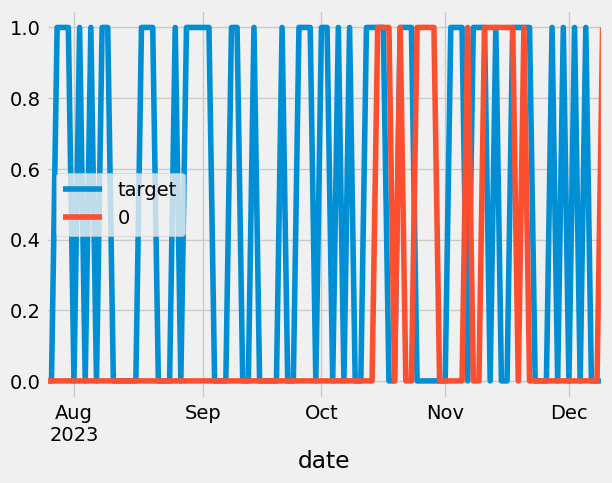

In [56]:
combined.plot()

 0 - красная линия - наши предсказания
 target - голубая линия - что на самом деле произошло
 
 местами конечно предсказано, что цены повысятся, но сомнительно и не окей...
 
 попробуем найти более устойчивый способ, чтобы проверить алгоритм

In [57]:

# создадим функцию предикта
def predict(train, test, predictors, model):
    model.fit(train[predictors], train["target"])
    preds = model.predict(test[predictors])
    preds = pd.Series(preds, index=test.index, name='predictions')
    combined = pd.concat([test['target'], preds], axis=1)
    return combined

In [58]:
#попробуем backtesting для оценки погрешности
def backtest(data, model, predictors, start=250, step=50):
    all_predictions = []
    
    for i in range(start, data.shape[0], step):
        train = data.iloc[0:].copy()
        test = data.iloc[i: (i+step)].copy()
        predictions = predict(train, test, predictors, model)
        all_predictions.append(predictions)
    return pd.concat(all_predictions)

In [59]:
predictions = backtest(df1, model, predictors)

In [60]:
# можем оценить погрешность в предсказаниях
predictions['predictions'].value_counts()

predictions
1    367
0    125
Name: count, dtype: int64

In [61]:
precision_score(predictions['target'], predictions['predictions'])

0.6566757493188011

За 492 дня мы на 66% были верны

т.е. если бы мы сказали, что цена акции взлетит, мы бы были правы на 66 %

In [62]:
# посмотрим процент дней, когда рынок действительно взлетел
predictions['target'].value_counts() / predictions.shape[0]

target
1    0.538618
0    0.461382
Name: count, dtype: float64

и все же 66% немного лучше, чем 53.8% , который представляет собой просто естественное кол-во дней, когда цены повысились

* Добавим дополнительные предикторы к модели
    * Добавим различные rolling averages, которые как раз таки и рассчитывали выше


In [63]:
horizons = [2, 10, 50, 100]
new_predictors = []

for horizon in horizons:
    rolling_averages = df1.rolling(horizon).mean()
    ratio_column = f"Close_Ratio_{horizon}"
    df1[ratio_column] = df1['close'] / rolling_averages['close']
    
    trend_column = f"Trend_{horizon}"
    df1[trend_column] = df1.shift(1).rolling(horizon).sum()['target']
    # в любой день можно посмотр. на посл неск дней и увидит ср. суммы таргета
    # добавим к новым предикторам
    new_predictors += [ratio_column, trend_column]

In [64]:
# избавимся от пропущенных значений
df1 = df1.dropna()
df1

,open,high,low,close,vol,year,tomorrow,target,Close_Ratio_2,Trend_2,Close_Ratio_10,Trend_10,Close_Ratio_50,Trend_50,Close_Ratio_100,Trend_100
date,,,,,,,,,,,,,,,,
2021-05-06,1200.0,1209.5,1182.5,1182.5,39592,2021,1200.5,1,0.993280,1.0,0.995370,5.0,0.962438,19.0,0.975390,37.0
2021-05-07,1189.0,1202.0,1185.0,1200.5,27727,2021,1209.5,1,1.007554,1.0,1.008908,5.0,0.976524,20.0,0.990405,38.0
2021-05-10,1202.5,1212.0,1199.0,1209.5,45556,2021,1202.0,0,1.003734,2.0,1.014043,6.0,0.983086,21.0,0.997876,39.0
2021-05-11,1209.5,1209.5,1195.5,1202.0,35043,2021,1193.0,0,0.996890,1.0,1.008178,5.0,0.976164,21.0,0.991806,38.0
2021-05-12,1208.5,1210.0,1193.0,1193.0,28169,2021,1187.0,0,0.996242,0.0,1.001385,5.0,0.968116,21.0,0.984478,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-04,1741.0,1746.0,1708.0,1712.0,252757,2023,1759.5,1,0.991602,1.0,0.984559,5.0,1.061863,27.0,1.136718,49.0
2023-12-05,1714.5,1760.5,1711.0,1759.5,404864,2023,1715.5,0,1.013683,1.0,1.010626,5.0,1.086433,28.0,1.165023,50.0
2023-12-06,1760.5,1766.5,1715.0,1715.5,253839,2023,1717.5,1,0.987338,1.0,0.986912,4.0,1.055549,27.0,1.132979,50.0


In [65]:
# обновим модель
model = RandomForestClassifier(n_estimators=200, min_samples_split=50, random_state=1)

In [66]:
def predict(train, test, predictors, model):
    model.fit(train[predictors], train["target"])
    # возьмем только вреоятность того, что цена взлетит
    preds = model.predict_proba(test[predictors])[:, 1]
    # установим собственную границу
    preds[preds >= .6] = 1
    preds[preds < .6] = 0
    # default threshold 0.5
    preds = pd.Series(preds, index=test.index, name='predictions')
    combined = pd.concat([test['target'], preds], axis=1)
    return combined

In [67]:
predictions = backtest(df1, model, new_predictors)

In [68]:
predictions['predictions'].value_counts()

predictions
0.0    295
1.0     96
Name: count, dtype: int64

In [69]:
# сейчас намного меньше дней, дело в threshold
precision_score(predictions['target'], predictions['predictions'])

0.90625

Это хороший результат и намного лучше бейзлайна

* можно еще включить общие макроэкономические показатели, как процентн. ставки, инфляция, и тд

* учесть поминунтные изменения

Так как данные временного ряда при кросс-валидации нельзя перемешивать, используется «оконный подход». Лучше всего процесс демонстрирует следующая схема:

<font color='red'>Кросс-валидация применяется для вычисления качества модели таким образом, чтобы особенности данных не влияли на оценку. То есть оценка должна быть несмещённой. Что касается средней оценки, то она считается на подмножествах данных, что исключает получение слишком оптимистичных или слишком пессимистичных прогнозов. </font>

Для обучения моделей time-series data есть основные 3 подхода:
* классическая ARIMA модель
* собственная модель Facebook Prophet, специально разработанная для изучения временных рядов бизнеса
* LSTM, рекуррентный нейросетевой подход, который использовался для достижения наиболее известных результатов во многих задачах с последовательными данными$^{4}$.


$^{4}$ Neptune AI:https://neptune.ai/blog/arima-vs-prophet-vs-lstm

Поэтому попробу. сначала использовать LSTM:

In [70]:
# Рассмотрим Башнефть
df = df[df['ticker'] == 'BANEP']
df

,ticker,open,high,low,close,vol,year
date,,,,,,,
2020-12-10,BANEP,1214.5,1229.5,1212.0,1225.5,67116,2020
2020-12-11,BANEP,1228.5,1234.0,1218.5,1221.0,61651,2020
2020-12-14,BANEP,1225.0,1230.5,1215.0,1215.0,89688,2020
2020-12-15,BANEP,1218.5,1221.5,1212.0,1216.5,67263,2020
2020-12-16,BANEP,1213.0,1219.5,1202.5,1205.0,80695,2020
...,...,...,...,...,...,...,...
2023-12-05,BANEP,1714.5,1760.5,1711.0,1759.5,404864,2023
2023-12-06,BANEP,1760.5,1766.5,1715.0,1715.5,253839,2023
2023-12-07,BANEP,1718.0,1728.5,1700.0,1717.5,199515,2023


In [71]:
import math
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import *
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

In [72]:
df = df.close
df.head()

date
2020-12-10    1225.5
2020-12-11    1221.0
2020-12-14    1215.0
2020-12-15    1216.5
2020-12-16    1205.0
Name: close, dtype: float64

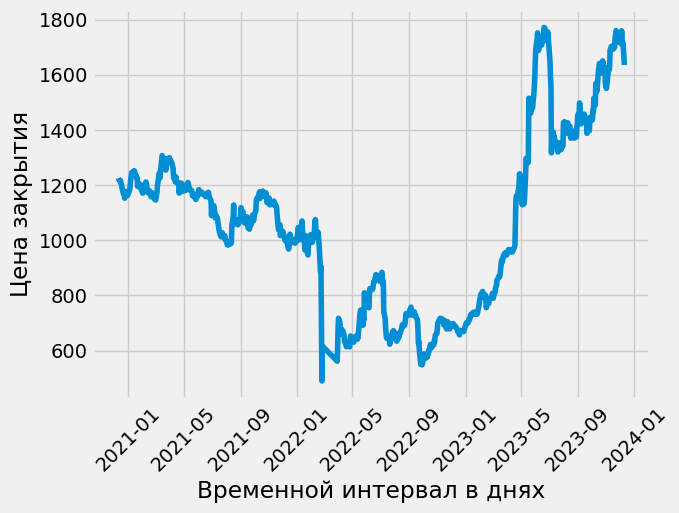

In [73]:
plt.plot(df)
plt.xlabel("Временной интервал в днях")
plt.ylabel("Цена закрытия")
plt.xticks(rotation=45);

In [74]:
scaler=MinMaxScaler() # нормализуем, чтобы использовать в LSTM
df=scaler.fit_transform(np.array(df).reshape(-1,1))

In [75]:
df = np.array(df)
train_size = int(len(df)*0.70)        
test_size = (len(df)-train_size)
training = df[:train_size, :]
test = df[train_size:len(df), :]

In [76]:
training.shape,test.shape

((519, 1), (223, 1))

In [77]:
time_step = 50                                                #Using the last 50 days to predict price for the 51st day
X_train, Y_train, X_test, Y_test = [],[],[],[]

for i in range(len(training)-time_step): # проводим предподготовку
    x = training[i:(i+time_step), 0]        
    X_train.append(x)
    Y_train.append(training[i+time_step,0])
for i in range(len(test)-time_step):
    x = test[i:(i+time_step), 0]
    X_test.append(x)
    Y_test.append(test[i+time_step,0])
X_train = np.array(X_train);
Y_train = np.array(Y_train);
X_test = np.array(X_test);
Y_test = np.array(Y_test);

In [78]:
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

In [79]:
X_train.shape, Y_train.shape

((469, 50, 1), (469,))

Регуляризация DropOut - это метод, который случайным образом удаляет некоторое количество нейронов в нейронной сети во время обучения модели.
Это означает, что вклад удаленных нейронов временно удаляется, и они не оказывают влияния на производительность модели.

In [80]:
model = Sequential()
# добавим первый слой LSTM и немного регуляризации DROPOUT

model.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model.add(Dropout(0.2))

# второй слой  и регуляризацию
model.add(LSTM(units = 50, return_sequences = True))
model.add(Dropout(0.2))

# третий слой  и регуляризацию
model.add(LSTM(units = 50))
# слой output
model.add(Dense(units = 1))

opt = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999)
# реккурентную нейрон. сеть
model.compile(optimizer = opt,  loss = 'mean_squared_error')

In [81]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50, 50)            10400     
                                                                 
 dropout (Dropout)           (None, 50, 50)            0         
                                                                 
 lstm_1 (LSTM)               (None, 50, 50)            20200     
                                                                 
 dropout_1 (Dropout)         (None, 50, 50)            0         
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 50851 (198.64 KB)
Trainable params: 50851 

In [82]:
model.fit(X_train, Y_train, epochs = 100, batch_size = 64)

Epoch 1/100
8/8 [==============================] - 13s 130ms/step - loss: 0.3682
Epoch 2/100
8/8 [==============================] - 1s 108ms/step - loss: 0.0294
Epoch 3/100
8/8 [==============================] - 1s 121ms/step - loss: 0.0197
Epoch 4/100
8/8 [==============================] - 1s 146ms/step - loss: 0.0125
Epoch 5/100
8/8 [==============================] - 1s 121ms/step - loss: 0.0057
Epoch 6/100
8/8 [==============================] - 2s 221ms/step - loss: 0.0056
Epoch 7/100
8/8 [==============================] - 1s 121ms/step - loss: 0.0053
Epoch 8/100
8/8 [==============================] - 1s 167ms/step - loss: 0.0049
Epoch 9/100
8/8 [==============================] - 1s 128ms/step - loss: 0.0037
Epoch 10/100
8/8 [==============================] - 1s 117ms/step - loss: 0.0039
Epoch 11/100
8/8 [==============================] - 1s 162ms/step - loss: 0.0030
Epoch 12/100
8/8 [==============================] - 2s 300ms/step - loss: 0.0029
Epoch 13/100
8/8 [==================

8/8 [==============================] - 1s 107ms/step - loss: 6.4071e-04


In [83]:
testpred=model.predict(X_test)
testpred=scaler.inverse_transform(testpred)
trainpred = model.predict(X_train)
trainpred = scaler.inverse_transform(trainpred)

15/15 [==============================] - 0s 27ms/step


In [84]:
math.sqrt(mean_squared_error(Y_train,trainpred))
math.sqrt(mean_squared_error(Y_test,testpred))

1452.9383662569821

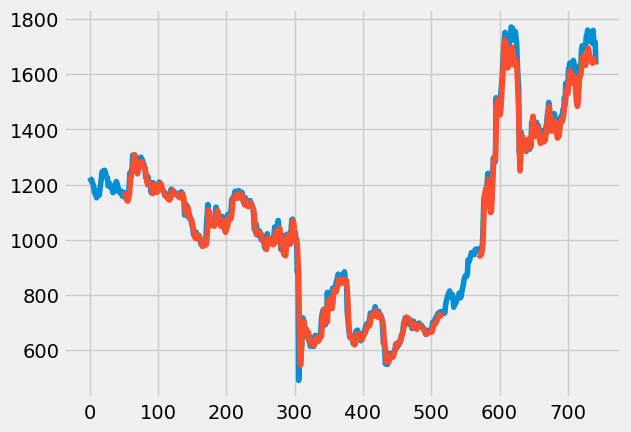

In [85]:
testPredictPlot = np.empty_like(df)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(Y_train)-2+(50*2)+1:len(df)-1, :] = testpred
trainPredictPlot = np.empty_like(df)
trainPredictPlot[:, :] = np.nan
testPredictPlot[50:len(Y_train)+50, :] = trainpred
plt.plot(scaler.inverse_transform(df))
plt.plot(testPredictPlot)
plt.plot(trainPredictPlot)
plt.show()

Все очень повторяется..но хорошо, попробуем предсказать следующие 30 дней.

In [86]:

f=test[(len(test)-50):,:].reshape(1,-1) 
print(f.shape) #
X=list(f)
X=X[0].tolist()

(1, 50)


In [87]:
# возьмем посл. 50 дней, чтобы предсказать 51-ый
# потом это вставим в датасет, предсказав 52-й, и т.д., последвоательно

output= []
for i in range(30):
    if (len(X)>50):
        f = np.array(X[-50:])
        f = f.reshape(1,-1)
        f = f.reshape((1, 50, 1))
        yhat = model.predict(f) 
        print(f)
        print(yhat)
        X.extend(yhat[0].tolist())
        output.extend(yhat.tolist())
    else:
        f = f.reshape((1,50,1))
        yhat = model.predict(f) 
        print(f)
        print(yhat)
        X.extend(yhat[0].tolist())
        output.extend(yhat.tolist())
print(output)

1/1 [==============================] - 0s 63ms/step
[[[0.74248927]
  [0.76706984]
  [0.76238783]
  [0.79984393]
  [0.78033554]
  [0.84120172]
  [0.82871635]
  [0.81818182]
  [0.82793601]
  [0.88177917]
  [0.88333984]
  [0.89816621]
  [0.88333984]
  [0.87085447]
  [0.88177917]
  [0.88646118]
  [0.9055794 ]
  [0.89660554]
  [0.88646118]
  [0.86617245]
  [0.83886071]
  [0.83261803]
  [0.82754584]
  [0.83808037]
  [0.87787749]
  [0.88958252]
  [0.87943816]
  [0.88958252]
  [0.93562232]
  [0.94693718]
  [0.94303551]
  [0.94420601]
  [0.93874366]
  [0.93874366]
  [0.94498634]
  [0.97385876]
  [0.97776044]
  [0.99141631]
  [0.98166211]
  [0.97619977]
  [0.97463909]
  [0.98088178]
  [0.95903238]
  [0.97619977]
  [0.95357004]
  [0.99063597]
  [0.95630121]
  [0.95786188]
  [0.95669138]
  [0.89387437]]]
[[0.8576622]]
1/1 [==============================] - 0s 63ms/step
[[[0.76706984]
  [0.76238783]
  [0.79984393]
  [0.78033554]
  [0.84120172]
  [0.82871635]
  [0.81818182]
  [0.82793601]
  [0.88177

1/1 [==============================] - 0s 63ms/step
[[[0.88333984]
  [0.89816621]
  [0.88333984]
  [0.87085447]
  [0.88177917]
  [0.88646118]
  [0.9055794 ]
  [0.89660554]
  [0.88646118]
  [0.86617245]
  [0.83886071]
  [0.83261803]
  [0.82754584]
  [0.83808037]
  [0.87787749]
  [0.88958252]
  [0.87943816]
  [0.88958252]
  [0.93562232]
  [0.94693718]
  [0.94303551]
  [0.94420601]
  [0.93874366]
  [0.93874366]
  [0.94498634]
  [0.97385876]
  [0.97776044]
  [0.99141631]
  [0.98166211]
  [0.97619977]
  [0.97463909]
  [0.98088178]
  [0.95903238]
  [0.97619977]
  [0.95357004]
  [0.99063597]
  [0.95630121]
  [0.95786188]
  [0.95669138]
  [0.89387437]
  [0.8576622 ]
  [0.80877268]
  [0.75610387]
  [0.7060883 ]
  [0.66282696]
  [0.62900853]
  [0.60556334]
  [0.59160942]
  [0.58508664]
  [0.58375496]]]
[[0.5858983]]
1/1 [==============================] - 0s 47ms/step
[[[0.89816621]
  [0.88333984]
  [0.87085447]
  [0.88177917]
  [0.88646118]
  [0.9055794 ]
  [0.89660554]
  [0.88646118]
  [0.86617

1/1 [==============================] - 0s 47ms/step
[[[0.83886071]
  [0.83261803]
  [0.82754584]
  [0.83808037]
  [0.87787749]
  [0.88958252]
  [0.87943816]
  [0.88958252]
  [0.93562232]
  [0.94693718]
  [0.94303551]
  [0.94420601]
  [0.93874366]
  [0.93874366]
  [0.94498634]
  [0.97385876]
  [0.97776044]
  [0.99141631]
  [0.98166211]
  [0.97619977]
  [0.97463909]
  [0.98088178]
  [0.95903238]
  [0.97619977]
  [0.95357004]
  [0.99063597]
  [0.95630121]
  [0.95786188]
  [0.95669138]
  [0.89387437]
  [0.8576622 ]
  [0.80877268]
  [0.75610387]
  [0.7060883 ]
  [0.66282696]
  [0.62900853]
  [0.60556334]
  [0.59160942]
  [0.58508664]
  [0.58375496]
  [0.58589828]
  [0.5904851 ]
  [0.59697419]
  [0.6050638 ]
  [0.61451513]
  [0.62507254]
  [0.63644129]
  [0.64829147]
  [0.660272  ]
  [0.67202145]]]
[[0.6831791]]
1/1 [==============================] - 0s 43ms/step
[[[0.83261803]
  [0.82754584]
  [0.83808037]
  [0.87787749]
  [0.88958252]
  [0.87943816]
  [0.88958252]
  [0.93562232]
  [0.94693

Text(0, 0.5, 'Цена акции')

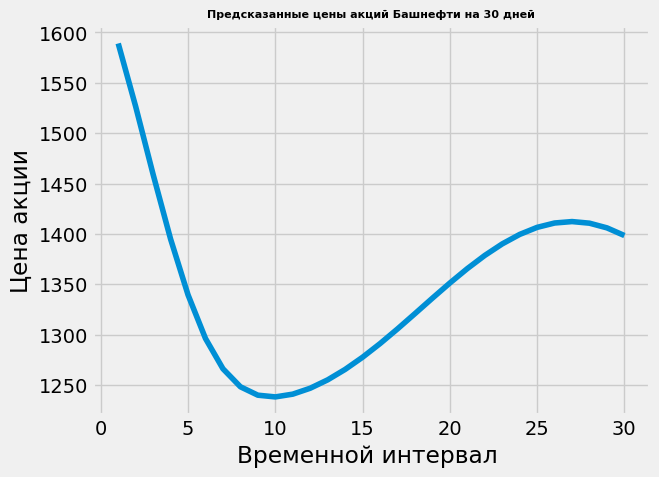

In [88]:
new = np.arange(1,31)
plt.plot(new,scaler.inverse_transform(output))
plt.title("Предсказанные цены акций Башнефти на 30 дней", fontsize=8, fontweight='bold')
plt.xlabel("Временной интервал ")
plt.ylabel("Цена акции")

Text(0, 0.5, 'Цена')

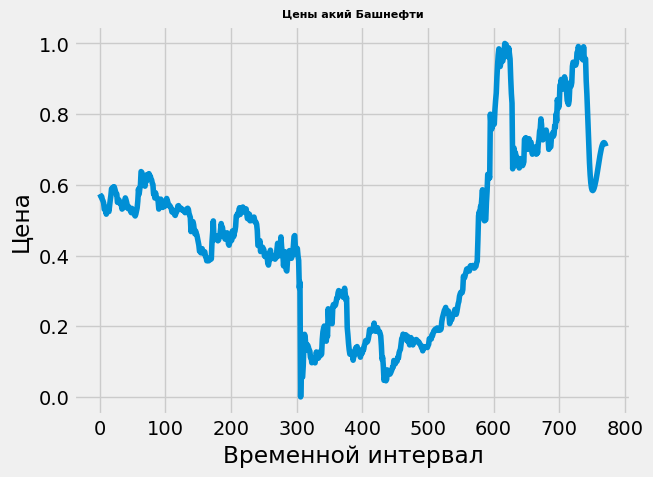

In [89]:
#Добавим к оригинальному датасету
df_graph = df.tolist()
df_graph.extend(output)
plt.plot(df_graph)
plt.title("Цены акий Башнефти", fontsize=8, fontweight='bold')
plt.xlabel("Временной интервал")
plt.ylabel("Цена")

In [90]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(df[-30:], output)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.07798236630958914


В данном случае можно сделать вывод об относительно низкой средней ошибке прогнозирования модели

Я бы еще попробовала посомтреть на ARIMA модель, но не успела, сделаю это позже для себя

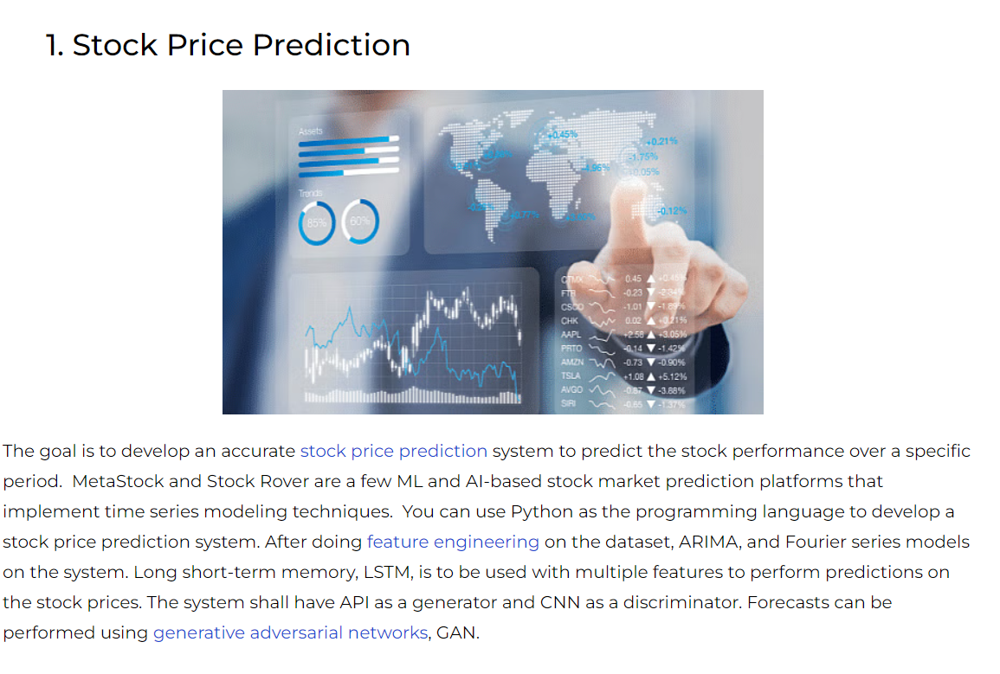